# 8. Support Vector Machines

The purpose of this notebook is to use Support Vector Machines , or SVM, to assess its ability to classify data. The results will be compared to that of the performance from the Multinomial Naive Bayes model, trained in [notebook 6](https://nataliermcastro.github.io/projects/2025/04/21/political-stances-naive-bayes-code.html).

---

## 1. Environment Creation

### 1.1 Library Import

In [1]:
''' DATA MANAGEMENT ''' 
import sklearn
import pandas as pd
from sklearn.model_selection import train_test_split
import os
import ast
from collections import Counter
import regex as re
import numpy as np

''' VECTORIZATION '''
from sklearn.feature_extraction.text import CountVectorizer

''' SENTIMENT '''
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.sentiment import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

''' DATA VISUALIZATION '''
import seaborn as sb
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pyLDAvis
import graphviz
from mpl_toolkits.mplot3d import Axes3D 
from mpl_toolkits.mplot3d import Axes3D 
from IPython.display import Image
import pydotplus
from matplotlib.ticker import MultipleLocator
from matplotlib.ticker import AutoMinorLocator
from tabulate import tabulate

''' SANITY '''
from tqdm import tqdm

''' SUPPORT VECTOR MACHINES '''
from sklearn.svm import LinearSVC

''' MODEL VERIFICATION  '''
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn import metrics
from sklearn.metrics import precision_score, recall_score, accuracy_score, balanced_accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\natal\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### 1.2 Function Definition

In [2]:
def train_test_splitter(data, label_column):
    
    data_train, data_test = train_test_split(data, test_size = 0.3,)
    labels_train = data_train[label_column]
    labels_test = data_test[label_column]
    
    #data_train.drop(columns='LABEL', inplace=True)
    #data_test.drop(columns='LABEL', inplace=True)
    
    
    return (data_train, data_test, labels_train, labels_test)

In [3]:

def visual_confusion_matrix(labels, predictions ,title, label_name, file_name, fig_x, fig_y):
    
    _labels = sorted(set(labels).union(set(predictions)))
    
    matrix_ = confusion_matrix(labels, predictions, labels=_labels)
    confusion_df = pd.DataFrame(matrix_, index=_labels, columns=_labels)

    fig, ax = plt.subplots(figsize=(fig_x, fig_y))
        
    
    sb.heatmap(confusion_df, annot = True, fmt='d', xticklabels=_labels, yticklabels=_labels, cbar_kws={'shrink': 0.5}, ax=ax)
    ax.set_title(f"Confusion Matrix:\n{title}\nLabels: {label_name}")
    ax.set_ylabel("True Labels")
    ax.set_xlabel("Predicted Labels")
    
    ax.set_aspect('equal', adjustable='box')
    #plt.subplots_adjust(left=0.15, right=0.85, top=0.85, bottom=0.15)
    
    # Save and show the plot
    
    plt.tight_layout(pad=.5)
    plt.savefig(file_name, dpi=600)
    
    plt.show()

In [4]:
def model_verification(true_labels, predictions):
    accuracy = accuracy_score(true_labels, predictions)
    precision = precision_score(true_labels, predictions, average='macro', zero_division = 0)
    recall = recall_score(true_labels, predictions, average='macro', zero_division = 0)
    
    return accuracy, precision, recall

In [5]:
def filter_top_n_labels(labels, predictions, N):
    matrix_ = confusion_matrix(labels, predictions)
    label_sums = matrix_.sum(axis=1)  
    
    top_labels_indices = label_sums.argsort()[-N:][::-1]  

    unique_labels = sorted(set(labels)) 
    top_labels = [unique_labels[i] for i in top_labels_indices]  
    
    mask = [yt in top_labels or yp in top_labels for yt, yp in zip(labels, predictions)]

    labels_filtered = [yt for yt, m in zip(labels, mask) if m]
    predictions_filtered = [yp for yp, m in zip(predictions, mask) if m]
    
    return labels_filtered[0:N], predictions_filtered[0:N]


In [6]:
## Support Vector Machine Modeler:

''' SVM INSANTIATION:

svm_model = sklearn.svm.SVC(C=100, kernel = 'rbf', degree = 3, gamma = 'auto', verbose = True)
'''
def svm_modeler(svm_model, data_train, labels_train, data_test, labels_test, label_column_name,
                graph_title, labels_name, file_name,filter_top_n = False, N=10 ,fig_x = 6, fig_y = 4):
    data_train = data_train.drop(columns = label_column_name).copy()
    data_test = data_test.drop(columns = label_column_name).copy()
    
    feature_names_train = list(data_train.columns)
    feature_names_test = list(data_test.columns)
    
    ## These may be edited depending on the test

    ## Fitting the data
    svm_model.fit(data_train, labels_train)
    
    ## Creating predictions
    predictions = svm_model.predict(data_test)
    

    ## Assessing the models abilitiy
    accuracy, precision, recall = model_verification(labels_test, predictions)
    
    ## Filtering for Clean Visualizations
        ## Filtering for Clean Visualizations
    if filter_top_n:
        # Call filter_top_n_labels to get filtered labels and predictions
        labels_test_filtered, predictions_filtered = filter_top_n_labels(labels_test, predictions, N)

        # If data remains after filtering, create the filtered confusion matrix
        if len(labels_test_filtered) > 0 and len(predictions_filtered) > 0:
            visual_confusion_matrix(labels_test_filtered, predictions_filtered,
                                    f"{graph_title} (Top {N})", labels_name,
                                    f"filtered_{file_name}", fig_x, fig_y)
        else:
            print(f"[Warning] No data left after filtering top {N} labels — skipping confusion matrix.")
    else:
        # If no filtering is needed, generate confusion matrix with all data
        visual_confusion_matrix(labels_test, predictions, graph_title, labels_name, file_name, fig_x, fig_y)
    
    return (accuracy, precision, recall)

### 1.3 Data Import

In [7]:
news_data = pd.read_csv(r"C:\Users\natal\OneDrive\university\info 5653\data\News Articles Lemmed- Count Vectorizer.csv")
news_data.fillna(0,inplace=True)
news_data.drop(columns='Unnamed: 0', inplace = True)

non_zero_condition = news_data['Party'] != 0
news_data = news_data[non_zero_condition]

In [8]:
bills_data = pd.read_csv(r"C:\Users\natal\OneDrive\university\info 5653\data\Bills Lemmed- Count Vectorizer.csv")
bills_data.fillna(0,inplace=True)
bills_data.drop(columns='Unnamed: 0', inplace = True)

non_zero_condition = bills_data['Committees'] != 0
bills_data = bills_data[non_zero_condition]

In [9]:
party_data = pd.read_csv(r"C:\Users\natal\OneDrive\university\info 5653\data\Party Platform Lemmed- Count Vectorizer.csv")
party_data.drop(columns='Unnamed: 0', inplace = True)

In [10]:
''' REVECTORIZING DATA '''

## Recreate CountVectorizer with the original vocabulary
vectorizer_news = CountVectorizer(vocabulary=news_data.columns)
vectorizer_bills = CountVectorizer(vocabulary=bills_data.columns)
vectorizer_party = CountVectorizer(vocabulary=party_data.columns)


In [11]:
''' PULLING OUT THE FEATURE NAMES '''
features_news = news_data.columns.to_list()
features_bills = bills_data.columns.to_list()
features_party = party_data.columns.to_list()

## Removing the labels
features_news = features_news[2:]
features_bills = features_bills[4:]
features_party = features_party[1:]

In [12]:
''' CREATING A COMBINED LABEL COLUMN FOR MORE LABEL INFORMATINO IN SKLEARN '''

news_data.insert(0, 'LABEL', news_data['Party'].astype(str).fillna('') + ' | ' + news_data['publisher'].astype(str).fillna(''))

## note: the committee was not added to this because of the diversity and length  of the committee
## - so the purpose of this column is more in order to generate a nunance about sponser state, affiliation,
## and bill type
bills_data.insert(0, 'LABEL', bills_data['Bill Type'].astype(str).fillna('') + ' | ' + bills_data['Sponser Affiliation'].astype(str).fillna('') +' | ' + bills_data['Sponser State'].astype(str).fillna(''))

In [13]:
''' STORING THE LABELS '''

## News Data
labels_news_party = news_data['Party'].to_list()
labels_news_publisher = news_data['publisher'].to_list()
labels_news_combined = news_data['LABEL'].to_list()

## Bill Data
labels_bills_billtype = bills_data['Bill Type']
labels_bills_sponser_affiliation = bills_data['Sponser Affiliation']
labels_bills_sponser_state = bills_data['Sponser State']
labels_bills_committees = bills_data['Committees']
labels_bills_combined = bills_data['LABEL'].to_list()

## Party Platform Data
labels_party_party = party_data['Party']

In [14]:
news_data.head(2)

,LABEL,Party,publisher,aapi,abandon,abandoned,abc,ability,able,abolish,...,yes,york,young,youth,zealot,zeldin,zero,zers,zone,zuckerberg
0,Republican | The Verge,Republican,The Verge,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Republican | Gizmodo.com,Republican,Gizmodo.com,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
bills_data.head(2)

,LABEL,Bill Type,Sponser Affiliation,Sponser State,Committees,aa,aaa,aarhu,ab,abandon,...,zoe,zone,zonea,zonesnotwithstand,zoneth,zoo,zoolog,zoonot,zooplankton,zquez
0,hr | D | HI,hr,D,HI,"House - Natural Resources, Agriculture | Senat...",0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,hr | R | NY,hr,R,NY,House - Agriculture,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [16]:
party_data.head()

,Party,ability,able,abortion,access,accessible,according,accountability,accountable,achieved,...,won,word,work,worker,working,world,worship,worst,year,young
0,Republican,1,1,1,4,1,1,1,4,1,...,1,1,4,15,2,15,2,1,7,7
1,Democrat,7,13,13,72,15,1,6,14,1,...,10,1,101,79,81,69,4,4,149,10


## 2. Sentiment Labeling

To generate labels for sentiment, specifically for this task, I will be using the Natural Language Toolkit's SentimentIntensityAnalyzer. This will then be used to assign an average sentiment score based on paritioned scores generated. The range of these scores will then be used to generate categorical labels to inform about sentiment.

In [17]:
def word_scorer(x):
    sentiment = sia.polarity_scores(text=x)
    return (sentiment['compound'])

In [18]:
## First generating a string with that many words in it
def repeat_word(col):
    word = col.name
    return col.apply(lambda count: (word + ' ') * int(count) if count > 0 else '')

party_data_words = party_data.drop(columns=['Party']).apply(repeat_word).copy()
bills_data_words = bills_data.drop(columns=['LABEL','Bill Type','Sponser Affiliation','Sponser State','Committees']).apply(repeat_word).copy()
news_data_words = news_data.drop(columns=['LABEL','Party','publisher']).apply(repeat_word).copy()

party_data_words['FULL TEXT'] = party_data_words.apply(lambda row: ' '.join(row.astype(str)), axis=1)
bills_data_words['FULL TEXT'] = bills_data_words.apply(lambda row: ' '.join(row.astype(str)), axis=1)
news_data_words['FULL TEXT'] = news_data_words.apply(lambda row: ' '.join(row.astype(str)), axis=1)

party_data_words['FULL TEXT'] = party_data_words['FULL TEXT'].str.replace(r'\s+', ' ', regex=True).str.strip()
bills_data_words['FULL TEXT'] = bills_data_words['FULL TEXT'].str.replace(r'\s+', ' ', regex=True).str.strip()
news_data_words['FULL TEXT'] = news_data_words['FULL TEXT'].str.replace(r'\s+', ' ', regex=True).str.strip()

party_data_words.insert(0, 'Sentiment Value',party_data_words['FULL TEXT'].apply(lambda x: word_scorer(x)))
bills_data_words.insert(0, 'Sentiment Value', bills_data_words['FULL TEXT'].apply(lambda x: word_scorer(x)))
news_data_words.insert(0, 'Sentiment Value', news_data_words['FULL TEXT'].apply(lambda x: word_scorer(x)))

In [19]:
news_data_words.head(2)

,Sentiment Value,aapi,abandon,abandoned,abc,ability,able,abolish,abortion,absolutely,...,york,young,youth,zealot,zeldin,zero,zers,zone,zuckerberg,FULL TEXT
0,0.3612,,,,,,,,,,...,,,,,,,,,,ai backing billionaire day day donald electric...
1,-0.5994,,,,,,,,,,...,,,,,,,,,,biden biden climate come corp death green job ...


In [20]:
def sentiment_translator(x):
    if x >= 0.7:
        return ("Positive")

    else:
        return ("Negative")

party_data_words.insert(0, 'Sentiment Label',party_data_words['Sentiment Value'].apply(lambda x: sentiment_translator(x)))
bills_data_words.insert(0, 'Sentiment Label', bills_data_words['Sentiment Value'].apply(lambda x: sentiment_translator(x)))
news_data_words.insert(0, 'Sentiment Label', news_data_words['Sentiment Value'].apply(lambda x: sentiment_translator(x)))

In [21]:
sentiment_party_values = party_data_words['Sentiment Value'].to_list()
sentiment_bills_values = bills_data_words['Sentiment Value'].to_list()
sentiment_news_values = news_data_words['Sentiment Value'].to_list()

sentiment_party_labels = party_data_words['Sentiment Label'].to_list()
sentiment_bills_labels = bills_data_words['Sentiment Label'].to_list()
sentiment_news_labels = news_data_words['Sentiment Label'].to_list()

**Note**: With such long texts, the sentiment scores did not tend negative. A distribution that is appropriate for this dataset will be generated now.

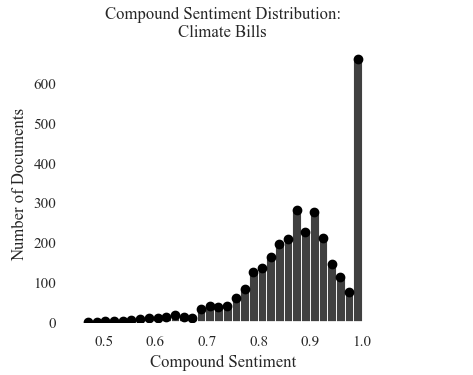

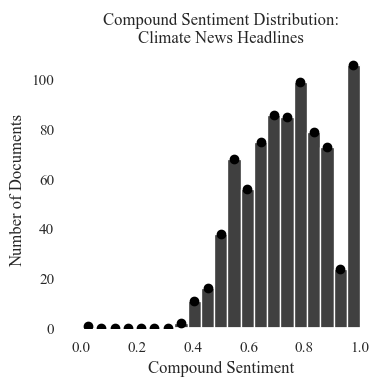

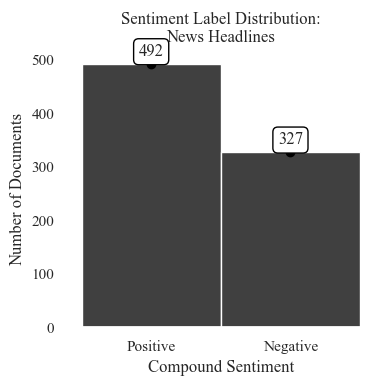

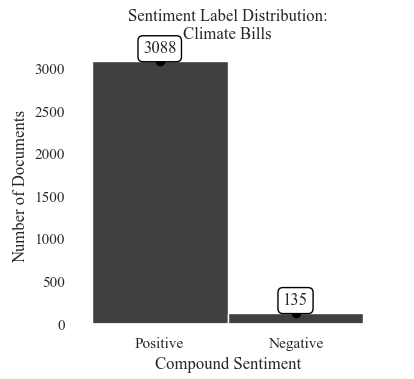

In [131]:
''' EXPLORING NEGATIVE SENTIMENTS'''
print (news_data_words.at[148,'FULL TEXT'])
print ("\nSentiment:")
print (news_data_words.at[148, 'Sentiment Value'])

claim crisis decade democracy democracy donald highlight mandate popular president republican state strong trump trump trump united vote won

Sentiment:
0.467


In [135]:
print (bills_data_words.at[3106,'FULL TEXT'])
print ("\nSentiment:")
print (bills_data_words.at[3106, 'Sentiment Value'])

acid acid acid acid definedin demonstr drainag drainag drainag drainag great great great great great great great harm lake lake lake lake lake lake lake march mile prevent prevent purposeth seek sought stupak sulfid sulfid sulfid sulfid unless

Sentiment:
0.495


In [132]:
''' EXPLORING POSITIVE SENTIMENTS'''
print (bills_data_words.at[3,'FULL TEXT'])
print ("\nSentiment:")
print (bills_data_words.at[3, 'Sentiment Value'])

amendmentsect concerneda courtney fall grantssect grantssect island island island island island island island long long long long long long long matter note preced reauthor reauthor reauthor reauthor redesign representativesjanuari restor restor sound sound sound sound sound sound sound speaker stewardship stewardship stewardship stewardship technic

Sentiment:
0.975


In [124]:
print (news_data_words.at[814,'FULL TEXT'])
print ("\nSentiment:")
print (news_data_words.at[814, 'Sentiment Value'])

arriving attack capital capitol celebration city day donald herald inaugural inauguration kick mark nation pageantry power president return return saturday second shadow supporter trump trump washington year

Sentiment:
0.828


In [24]:
''' ADDING LABELS TO THE ORIGINAL DATA '''
news_data.insert(0, 'SENTIMENT', sentiment_news_labels)
bills_data.insert(0, 'SENTIMENT', sentiment_bills_labels)
party_data.insert(0, 'SENTIMENT', sentiment_party_labels)

In [25]:
news_data.head(2)

,SENTIMENT,LABEL,Party,publisher,aapi,abandon,abandoned,abc,ability,able,...,yes,york,young,youth,zealot,zeldin,zero,zers,zone,zuckerberg
0,Negative,Republican | The Verge,Republican,The Verge,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Negative,Republican | Gizmodo.com,Republican,Gizmodo.com,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 3. Data Preparation

### 3.1 Generating a Train Test Split for the Data

#### 3.1.1 News Data

In [26]:
## Creating individually labeled sets for the data

news_data_label_party = news_data.drop(columns = ['publisher', 'LABEL', 'SENTIMENT',])
data_train_news_party, data_test_news_party, labels_train_news_party, labels_test_news_party = train_test_splitter(news_data_label_party,'Party')

news_data_label_publisher = news_data.drop(columns = ['Party', 'LABEL', 'SENTIMENT'])
data_train_news_publisher, data_test_news_publisher, labels_train_news_publisher, labels_test_news_publisher = train_test_splitter(news_data_label_publisher,'publisher')

news_data_label_combined = news_data.drop(columns = ['Party', 'publisher','SENTIMENT'])
data_train_news_combined, data_test_news_combined, labels_train_news_combined, labels_test_news_combined = train_test_splitter(news_data_label_combined,'LABEL')

news_data_label_sentiment = news_data.drop(columns = ['publisher', 'LABEL','Party'])
data_train_news_sentiment, data_test_news_sentiment, labels_train_news_sentiment, labels_test_news_sentiment = train_test_splitter(news_data_label_sentiment,'SENTIMENT')


#### 3.1.2 Bills Data

In [27]:
bills_data_label_party = bills_data.drop(columns = ['LABEL', 'Bill Type', 'Sponser State', 'Committees', 'SENTIMENT'])
data_train_bills_party, data_test_bills_party, labels_train_bills_party, labels_test_bills_party = train_test_splitter(bills_data_label_party,'Sponser Affiliation')


bills_data_label_state = bills_data.drop(columns = ['LABEL', 'Bill Type', 'Sponser Affiliation', 'Committees', 'SENTIMENT'])
data_train_bills_state, data_test_bills_state, labels_train_bills_state, labels_test_bills_state = train_test_splitter(bills_data_label_state,'Sponser State')


bills_data_label_combined = bills_data.drop(columns = ['Sponser State', 'Bill Type', 'Sponser Affiliation', 'Committees', 'SENTIMENT'])
data_train_bills_combined, data_test_bills_combined, labels_train_bills_combined, labels_test_bills_combined = train_test_splitter(bills_data_label_combined,'LABEL')

bills_data_label_type = bills_data.drop(columns = ['LABEL', 'Sponser State', 'Sponser Affiliation', 'Committees', 'SENTIMENT'])
data_train_bills_type, data_test_bills_type, labels_train_bills_type, labels_test_bills_type = train_test_splitter(bills_data_label_type,'Bill Type')

bills_data_label_committee = bills_data.drop(columns = ['LABEL', 'Bill Type', 'Sponser Affiliation', 'Sponser State', 'SENTIMENT'])
data_train_bills_committee, data_test_bills_committee, labels_train_bills_committee, labels_test_bills_committee = train_test_splitter(bills_data_label_committee,'Committees')

bills_data_label_sentiment = bills_data.drop(columns = ['LABEL', 'Bill Type', 'Sponser Affiliation', 'Sponser State','Committees'])
data_train_bills_sentiment, data_test_bills_sentiment, labels_train_bills_sentiment, labels_test_bills_sentiment = train_test_splitter(bills_data_label_sentiment,'SENTIMENT')



In [28]:
length_data = [['News Headline: Partisian Affiliation',len(data_train_news_party), len(data_test_news_party)],
['News Headlines: Publisher',len(data_train_news_publisher), len(data_test_news_publisher)], 
['News Headlines: Publisher and Partisian Affiliation',len(data_train_news_combined), len(data_test_news_combined)], 
['News Headlines: Sentiment',len(data_train_news_sentiment), len(data_test_news_sentiment)],
['Climate Bills: Sponsor Affiliation',len(data_train_bills_party), len(data_test_bills_party)], 
['Climate Bills: Sponsor State',len(data_train_bills_state), len(data_test_bills_state)], 
['Climate Bills: Metadata',len(data_train_bills_combined), len(data_test_bills_combined)], 
['Climate Bills: Bill Type',len(data_train_bills_type), len(data_test_bills_type)], 
['Climate Bills: Hearing Committee',len(data_train_bills_committee), len(data_test_bills_committee)],
['Climate Bills: Sentiment',len(data_train_bills_sentiment), len(data_test_bills_sentiment)]]

headers = ['', ' Training Data', 'Testing Data']

length_table = tabulate(length_data, headers=headers, tablefmt='html', numalign='center', stralign = 'left')

with open("Support Vector Model - Train Test Split Lengths.html", "w") as file:
    file.write(length_table)
    
length_table

,Training Data,Testing Data
News Headline: Partisian Affiliation,573,246
News Headlines: Publisher,573,246
News Headlines: Publisher and Partisian Affiliation,573,246
News Headlines: Sentiment,573,246
Climate Bills: Sponsor Affiliation,2256,967
Climate Bills: Sponsor State,2256,967
Climate Bills: Metadata,2256,967
Climate Bills: Bill Type,2256,967
Climate Bills: Hearing Committee,2256,967
Climate Bills: Sentiment,2256,967


## 3. Training The SVM Model

``` python
svm_linear_kernel = sklearn.svm.SVC(C=100, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_, precision_, recall_ = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = ,
                                                                                                         labels_train = ,
                                                                                                         data_test = ,
                                                                                                         labels_test = ,
                                                                                                         label_column_name = ,
                                                                                                         graph_title = ,
                                                                                                         labels_name = ,
                                                                                                         file_name = ,
                                                                                                         filter_top_n = ,
                                                                                                         N = ,
                                                                                                         fig_x = ,
                                                                                                         fig_y = )
                                                                                                         
```

### 3.1 Linear Kernel - Cost 100

### 3.1.1 News Data

#### 3.1.1.1 News Data: Partisianship

[LibSVM]

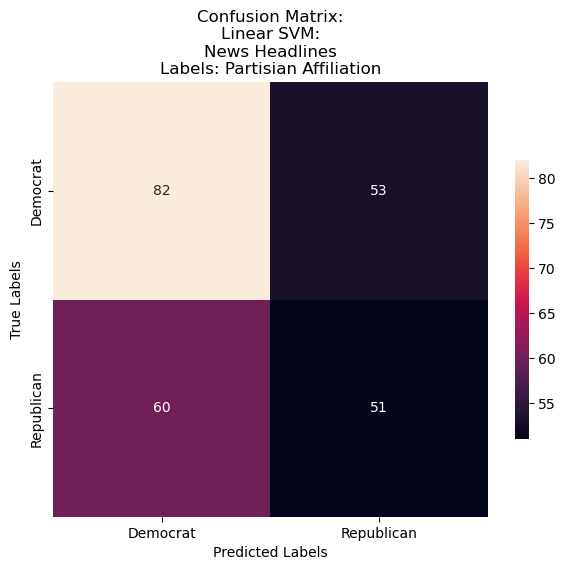

In [29]:
svm_linear_kernel = sklearn.svm.SVC(C=100, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_party, precision_news_data_party, recall_news_data_party = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_news_party,
                                                                                                         labels_train = labels_train_news_party,
                                                                                                         data_test = data_test_news_party,
                                                                                                         labels_test = labels_test_news_party,
                                                                                                         label_column_name = 'Party',
                                                                                                         graph_title = 'Linear SVM:\nNews Headlines',
                                                                                                         labels_name = 'Partisian Affiliation',
                                                                                                         file_name = 'svm - linear - news - party.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.1.1.2 News Data: Publisher

[LibSVM]

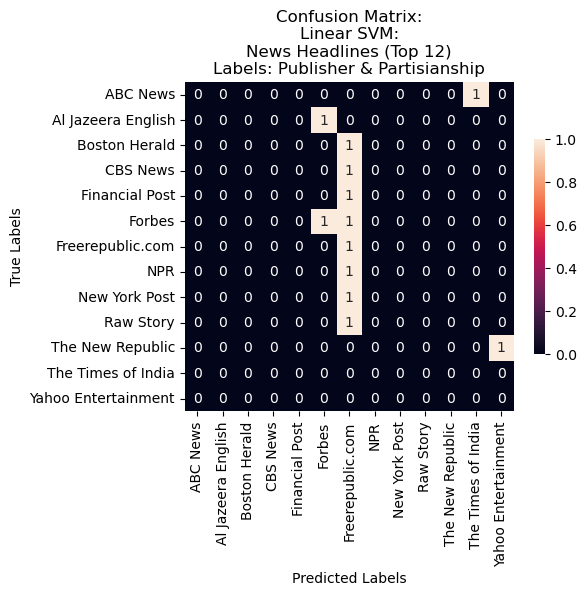

In [30]:
svm_linear_kernel = sklearn.svm.SVC(C=100, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_news_publisher,
                                                                                                         labels_train = labels_train_news_publisher,
                                                                                                         data_test = data_test_news_publisher,
                                                                                                         labels_test = labels_test_news_publisher,
                                                                                                         label_column_name = 'publisher',
                                                                                                         graph_title = 'Linear SVM:\nNews Headlines',
                                                                                                         labels_name = 'Publisher & Partisianship',
                                                                                                         file_name = 'svm - linear - news - metadata.png',
                                                                                                         filter_top_n = True,
                                                                                                         N = 12,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.1.1.3 News Data: Publisher + Partisianship

[LibSVM]

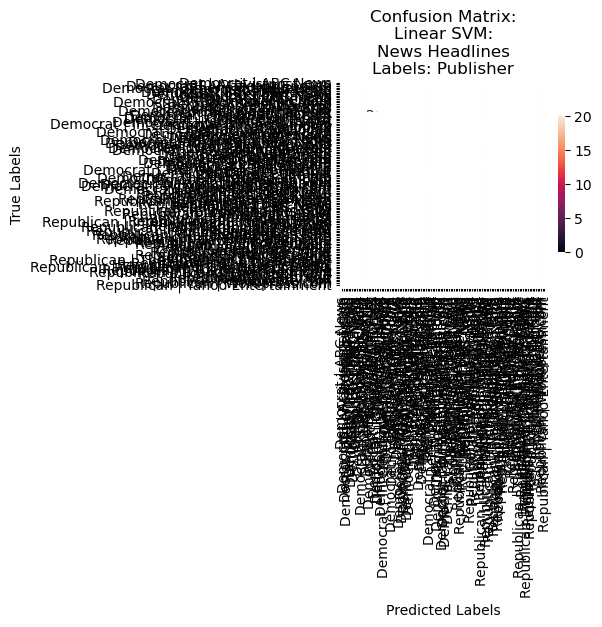

In [40]:
svm_linear_kernel = sklearn.svm.SVC(C=100, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_news_combined,
                                                                                                         labels_train = labels_train_news_combined,
                                                                                                         data_test = data_test_news_combined,
                                                                                                         labels_test = labels_test_news_combined,
                                                                                                         label_column_name = 'LABEL',
                                                                                                         graph_title = 'Linear SVM:\nNews Headlines',
                                                                                                         labels_name = 'Publisher',
                                                                                                         file_name = 'svm - linear - news - publisher.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 5,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.1.1.4 News Data: Sentiment

[LibSVM]

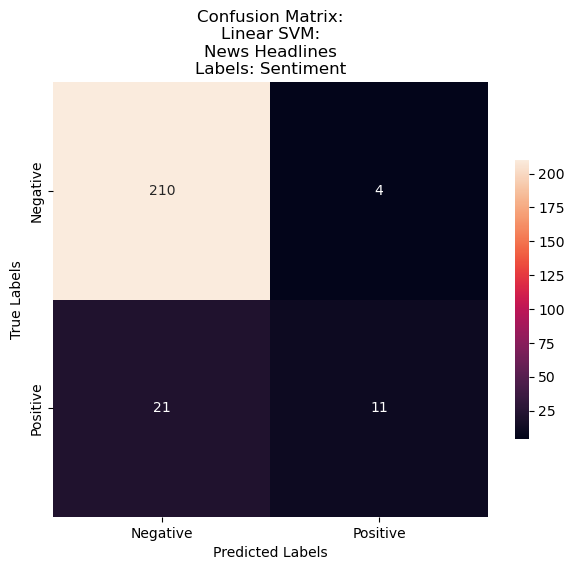

In [38]:
svm_linear_kernel = sklearn.svm.SVC(C=100, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_news_sentiment,
                                                                                                         labels_train = labels_train_news_sentiment,
                                                                                                         data_test = data_test_news_sentiment,
                                                                                                         labels_test = labels_test_news_sentiment,
                                                                                                         label_column_name = 'SENTIMENT',
                                                                                                         graph_title = 'Linear SVM:\nNews Headlines',
                                                                                                         labels_name = 'Sentiment',
                                                                                                         file_name = 'svm - linear - news - sentiment.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

### 3.1.2 Proposed Climate Bills

#### 3.1.2.1 Bills Data: Sponsor Affiliation

[LibSVM]

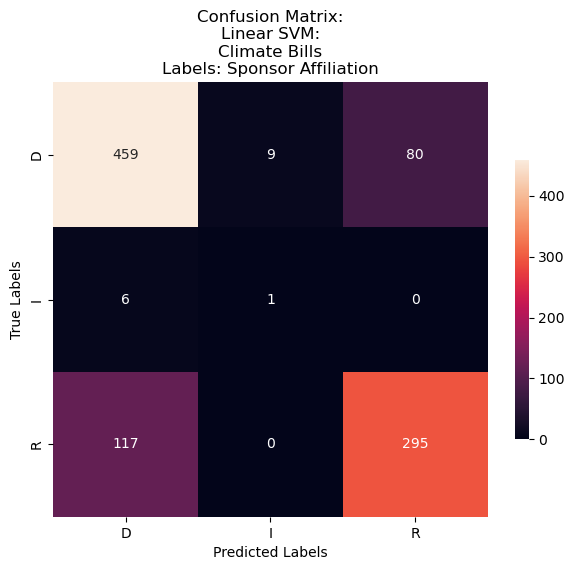

In [31]:
svm_linear_kernel = sklearn.svm.SVC(C=100, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_bills_party,
                                                                                                         labels_train = labels_train_bills_party,
                                                                                                         data_test = data_test_bills_party,
                                                                                                         labels_test = labels_test_bills_party,
                                                                                                         label_column_name = 'Sponser Affiliation',
                                                                                                         graph_title = 'Linear SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sponsor Affiliation',
                                                                                                         file_name = 'svm - linear - bills - sponsor party.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.1.2.2 Bills Data: Sponsor State

[LibSVM]

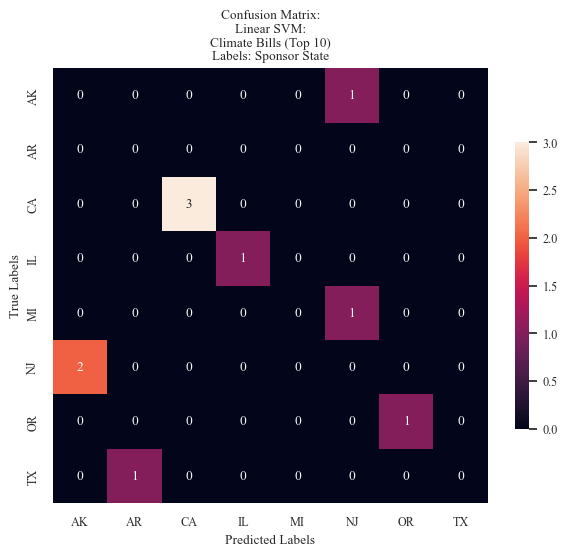

In [51]:
svm_linear_kernel = sklearn.svm.SVC(C=100, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_bills_state,
                                                                                                         labels_train = labels_train_bills_state,
                                                                                                         data_test = data_test_bills_state,
                                                                                                         labels_test = labels_test_bills_state,
                                                                                                         label_column_name = 'Sponser State',
                                                                                                         graph_title = 'Linear SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sponsor State',
                                                                                                         file_name = 'svm - linear - bills - sponsor state.png',
                                                                                                         filter_top_n = True,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.1.2.3 Bills Data: Committee

[LibSVM]

C:\Users\natal\AppData\Local\Temp\ipykernel_16624\1919670016.py:21: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(pad=.5)


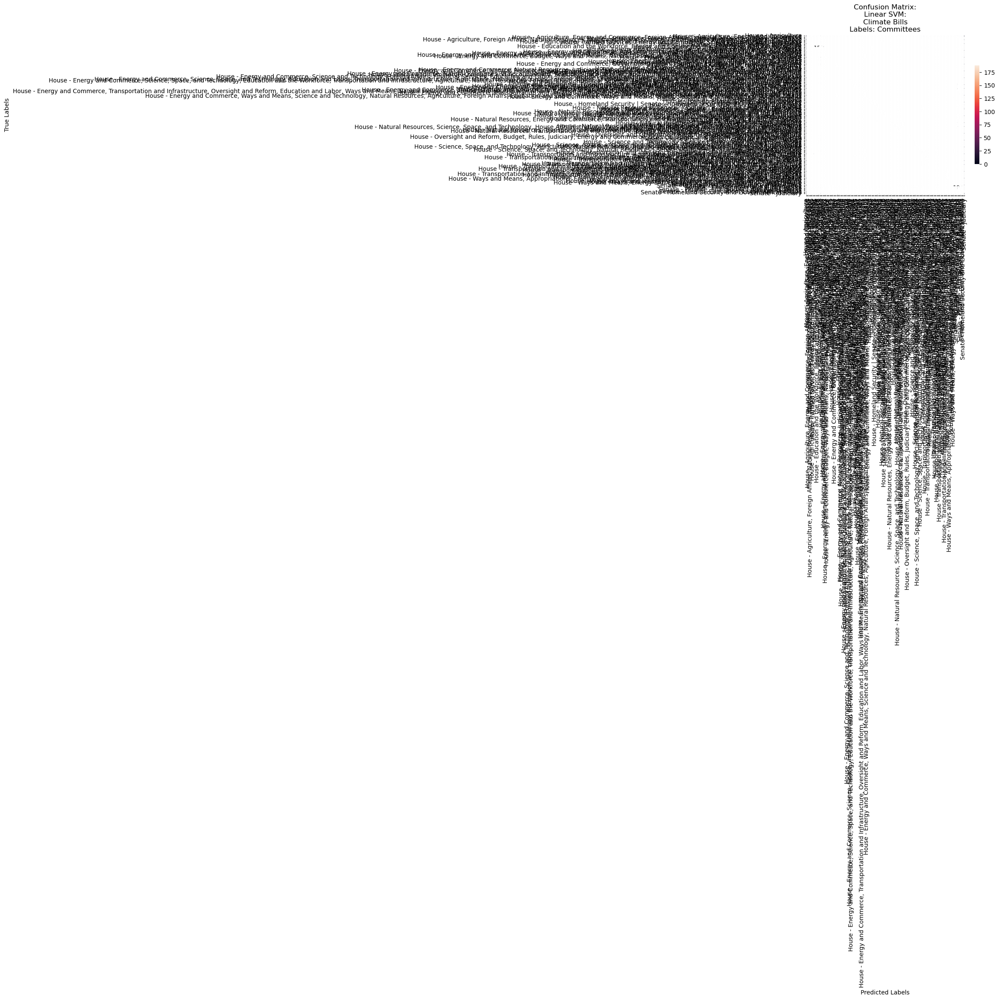

In [43]:
svm_linear_kernel = sklearn.svm.SVC(C=100, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_bills_committee,
                                                                                                         labels_train = labels_train_bills_committee,
                                                                                                         data_test = data_test_bills_committee,
                                                                                                         labels_test = labels_test_bills_committee,
                                                                                                         label_column_name = 'Committees',
                                                                                                         graph_title = 'Linear SVM:\nClimate Bills',
                                                                                                         labels_name = 'Committees',
                                                                                                         file_name = 'svm - linear - bills - commitees.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.1.2.4 Bills Data: Metadata

[LibSVM]

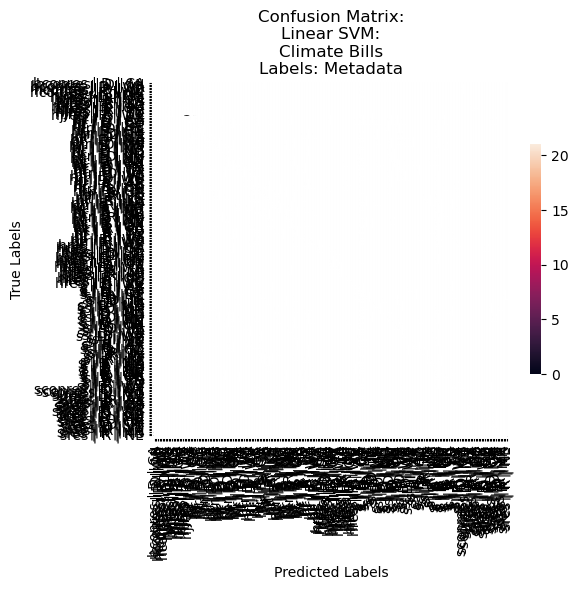

In [41]:
svm_linear_kernel = sklearn.svm.SVC(C=100, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_bills_combined,
                                                                                                         labels_train = labels_train_bills_combined,
                                                                                                         data_test = data_test_bills_combined,
                                                                                                         labels_test = labels_test_bills_combined,
                                                                                                         label_column_name = 'LABEL',
                                                                                                         graph_title = 'Linear SVM:\nClimate Bills',
                                                                                                         labels_name = 'Metadata',
                                                                                                         file_name = 'svm - linear - bills - metadata.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.1.2.4 Bills Data: Bill Type

[LibSVM]

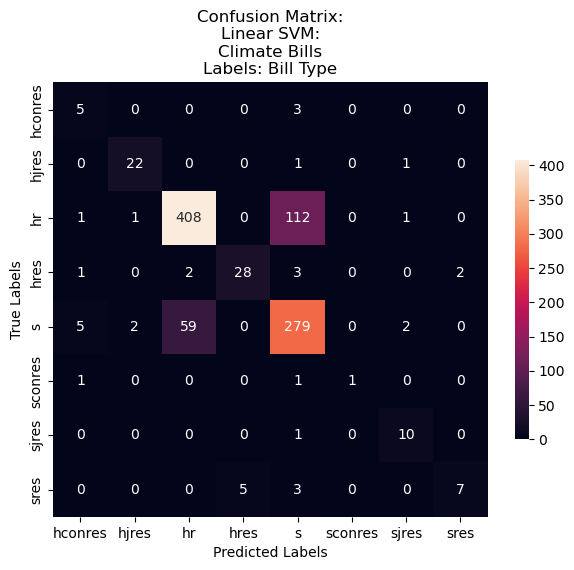

In [35]:
svm_linear_kernel = sklearn.svm.SVC(C=100, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_bills_type,
                                                                                                         labels_train = labels_train_bills_type,
                                                                                                         data_test = data_test_bills_type,
                                                                                                         labels_test = labels_test_bills_type,
                                                                                                         label_column_name = 'Bill Type',
                                                                                                         graph_title = 'Linear SVM:\nClimate Bills',
                                                                                                         labels_name = 'Bill Type',
                                                                                                         file_name = 'svm - linear - bills - bill type.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.1.2.5 Bills Data: Sentiment

[LibSVM]

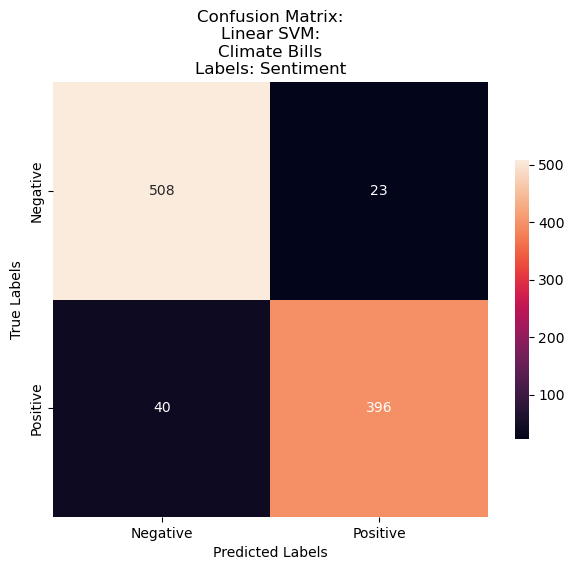

In [36]:
svm_linear_kernel = sklearn.svm.SVC(C=100, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_bills_sentiment,
                                                                                                         labels_train = labels_train_bills_sentiment,
                                                                                                         data_test = data_test_bills_sentiment,
                                                                                                         labels_test = labels_test_bills_sentiment,
                                                                                                         label_column_name = 'SENTIMENT',
                                                                                                         graph_title = 'Linear SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sentiment',
                                                                                                         file_name = 'svm - linear - bills - sentiment.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

### 3.2.3 Assessing Validity

In [45]:
data = [['News Headlines: Partisian Affiliation',accuracy_news_data_party, precision_news_data_party, recall_news_data_party],
['News Headlines: Publisher',accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher],
['News Headlines: Sentiment',accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment],
['News Headlines: Publisher and Partisian Affiliation',accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined],
['Climate Bills: Sponsor Affiliation',accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party],
['Climate Bills: Sponsor State',accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state],
['Climate Bills: Metadata',accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined],
['Climate Bills: Bill Type',accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type],
['Climate Bills: Hearing Committee',accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee],
['Climate Bills: Sentiment',accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment]]


for row in data:
    for i in range(1, 4):  # Loop over the columns with numeric data (index 1, 2, 3)
        row[i] = round(row[i], 3)
        
headers = ['', ' Accuracy', 'Precision', 'Recall']

table = tabulate(data, headers=headers, tablefmt='html', numalign='center', stralign = 'left')

with open("SVM Linear - Model Evaluation.html", "w") as file:
    file.write(table)

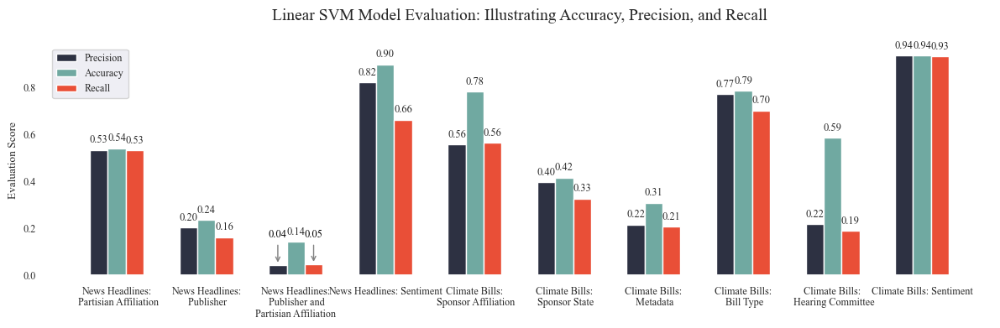

In [50]:
data = [['News Headlines:\n Partisian Affiliation',accuracy_news_data_party, precision_news_data_party, recall_news_data_party],
['News Headlines:\n Publisher',accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher],
['News Headlines:\n Publisher and\nPartisian Affiliation',accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined],
['News Headlines: Sentiment',accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment],
['Climate Bills:\n Sponsor Affiliation',accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party],
['Climate Bills:\n Sponsor State',accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state],
['Climate Bills:\n Metadata',accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined],
['Climate Bills:\n Bill Type',accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type],
['Climate Bills:\n Hearing Committee',accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee],
['Climate Bills: Sentiment',accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment]]


for row in data:
    for i in range(1, 4):  # Loop over the columns with numeric data (index 1, 2, 3)
        row[i] = round(row[i], 3)

model_eval = pd.DataFrame(data, columns=['Model','Accuracy','Precision','Recall'])



fig, ax = plt.subplots(figsize=(12,4))
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=0.8)
ax.set_facecolor('white')

models = model_eval['Model'].to_list()
precision = model_eval['Precision'].to_list()
accuracy = model_eval['Accuracy'].to_list()
recall = model_eval['Recall'].to_list()



ax.set_facecolor('white')

# Width of the bars
bar_width = 0.2


index = np.arange(len(models))

# Plotting bars for Precision, Accuracy, and Recall
bar_precision = ax.bar(index - bar_width, precision, bar_width, label='Precision', color='#2d3142')
bar_accuracy = ax.bar(index, accuracy, bar_width, label='Accuracy', color='#70a9a1')
bar_recall = ax.bar(index + bar_width, recall, bar_width, label='Recall', color='#e94f37')

# Label each bar (with conditional floating & arrow)
def annotate_bars(bars):
    for bar in bars:
        x = bar.get_x() + bar.get_width() / 2
        y = bar.get_height()
        if y < 0.05:
            ax.annotate(
                f'{y:.2f}',
                xy=(x, y),
                xytext=(x, 0.15),
                textcoords='data',
                ha='center', va='bottom',
                arrowprops=dict(arrowstyle='->', color='gray'),
                fontsize=9,
                color='black'
            )
        else:
            ax.text(x, y + 0.02, f'{y:.2f}', ha='center', va='bottom', fontsize=9)

# Apply annotation
annotate_bars(bar_precision)
annotate_bars(bar_accuracy)
annotate_bars(bar_recall)

ax.set_title("Linear SVM Model Evaluation: Illustrating Accuracy, Precision, and Recall\n", fontsize=14)
ax.set_xlabel("")  
ax.set_ylabel("Evaluation Score")
ax.tick_params(axis='x')


ax.set_xticks(index)
ax.set_xticklabels(models)
'''ax.xaxis.set_minor_locator(AutoMinorLocator(5))'''



ax.legend()

plt.tight_layout()

plt.savefig("SVM Linear - Model Evaluation.png",dpi=1000)
plt.show();

### 3.2 Linear Kernel - Cost 1000

#### 3.2.1 News Data Partisianship

[LibSVM]

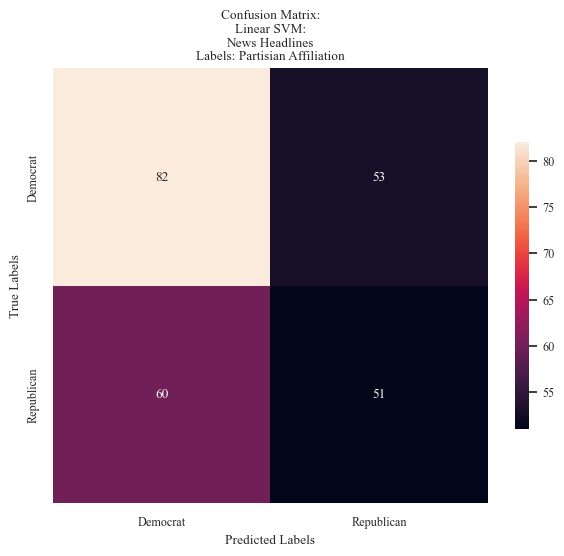

In [52]:
svm_linear_kernel = sklearn.svm.SVC(C=1000, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_party, precision_news_data_party, recall_news_data_party = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_news_party,
                                                                                                         labels_train = labels_train_news_party,
                                                                                                         data_test = data_test_news_party,
                                                                                                         labels_test = labels_test_news_party,
                                                                                                         label_column_name = 'Party',
                                                                                                         graph_title = 'Linear SVM:\nNews Headlines',
                                                                                                         labels_name = 'Partisian Affiliation',
                                                                                                         file_name = 'svm - linear - cost 1000 - news - party.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.2.1.2 News Data: Publisher

[LibSVM]

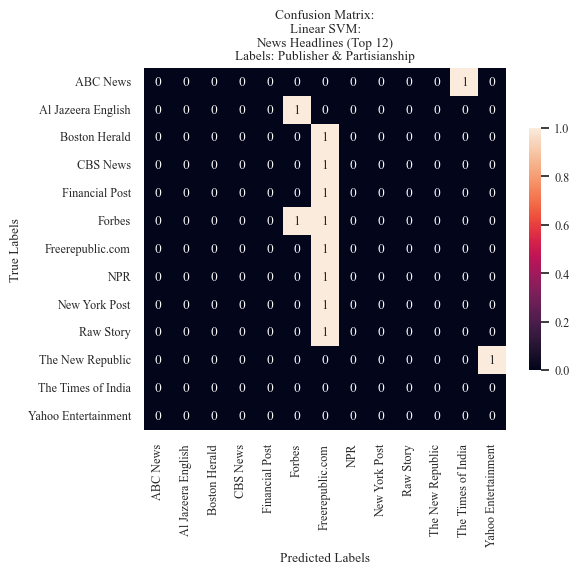

In [53]:
svm_linear_kernel = sklearn.svm.SVC(C=1000, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_news_publisher,
                                                                                                         labels_train = labels_train_news_publisher,
                                                                                                         data_test = data_test_news_publisher,
                                                                                                         labels_test = labels_test_news_publisher,
                                                                                                         label_column_name = 'publisher',
                                                                                                         graph_title = 'Linear SVM:\nNews Headlines',
                                                                                                         labels_name = 'Publisher & Partisianship',
                                                                                                         file_name = 'svm - linear - cost 1000 - news - metadata.png',
                                                                                                         filter_top_n = True,
                                                                                                         N = 12,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.2.1.3 News Data: Publisher + Partisianship

[LibSVM]

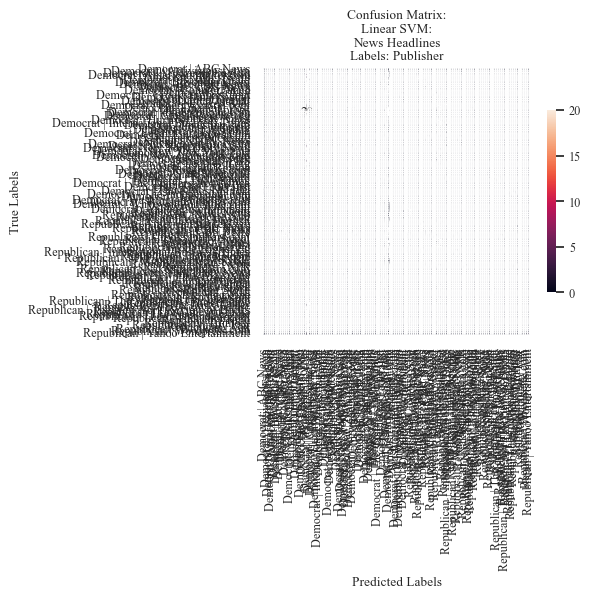

In [54]:
svm_linear_kernel = sklearn.svm.SVC(C=1000, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_news_combined,
                                                                                                         labels_train = labels_train_news_combined,
                                                                                                         data_test = data_test_news_combined,
                                                                                                         labels_test = labels_test_news_combined,
                                                                                                         label_column_name = 'LABEL',
                                                                                                         graph_title = 'Linear SVM:\nNews Headlines',
                                                                                                         labels_name = 'Publisher',
                                                                                                         file_name = 'svm - linear - cost 1000 - news - publisher.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 5,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.2.1.4 News Data: Sentiment

[LibSVM]

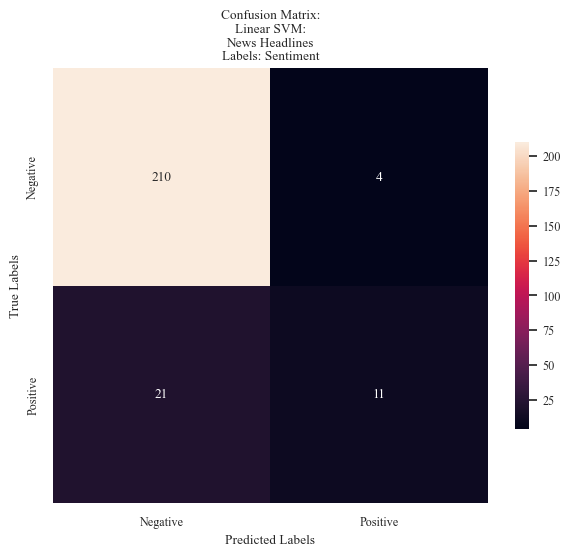

In [55]:
svm_linear_kernel = sklearn.svm.SVC(C=1000, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_news_sentiment,
                                                                                                         labels_train = labels_train_news_sentiment,
                                                                                                         data_test = data_test_news_sentiment,
                                                                                                         labels_test = labels_test_news_sentiment,
                                                                                                         label_column_name = 'SENTIMENT',
                                                                                                         graph_title = 'Linear SVM:\nNews Headlines',
                                                                                                         labels_name = 'Sentiment',
                                                                                                         file_name = 'svm - linear - cost 1000 - news - sentiment.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

### 3.2.2 Proposed Climate Bills

#### 3.2.2.1 Bills Data: Sponsor Affiliation

[LibSVM]

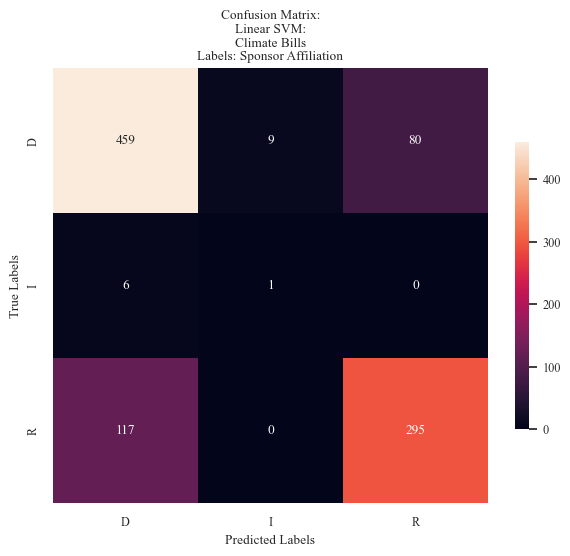

In [56]:
svm_linear_kernel = sklearn.svm.SVC(C=1000, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_bills_party,
                                                                                                         labels_train = labels_train_bills_party,
                                                                                                         data_test = data_test_bills_party,
                                                                                                         labels_test = labels_test_bills_party,
                                                                                                         label_column_name = 'Sponser Affiliation',
                                                                                                         graph_title = 'Linear SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sponsor Affiliation',
                                                                                                         file_name = 'svm - linear - cost 1000 - bills - sponsor party.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.2.2.2 Bills Data: Sponsor State

[LibSVM]

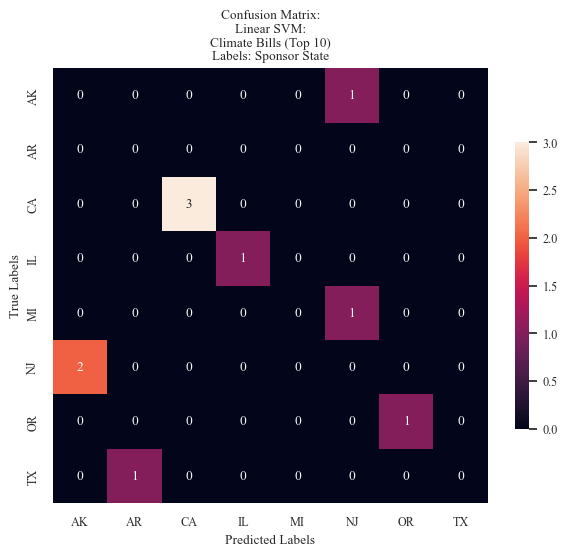

In [57]:
svm_linear_kernel = sklearn.svm.SVC(C=1000, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_bills_state,
                                                                                                         labels_train = labels_train_bills_state,
                                                                                                         data_test = data_test_bills_state,
                                                                                                         labels_test = labels_test_bills_state,
                                                                                                         label_column_name = 'Sponser State',
                                                                                                         graph_title = 'Linear SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sponsor State',
                                                                                                         file_name = 'svm - linear -cost 1000 - bills - sponsor state.png',
                                                                                                         filter_top_n = True,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.2.2.3 Bills Data: Committee

[LibSVM]

C:\Users\natal\AppData\Local\Temp\ipykernel_16624\1919670016.py:21: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(pad=.5)


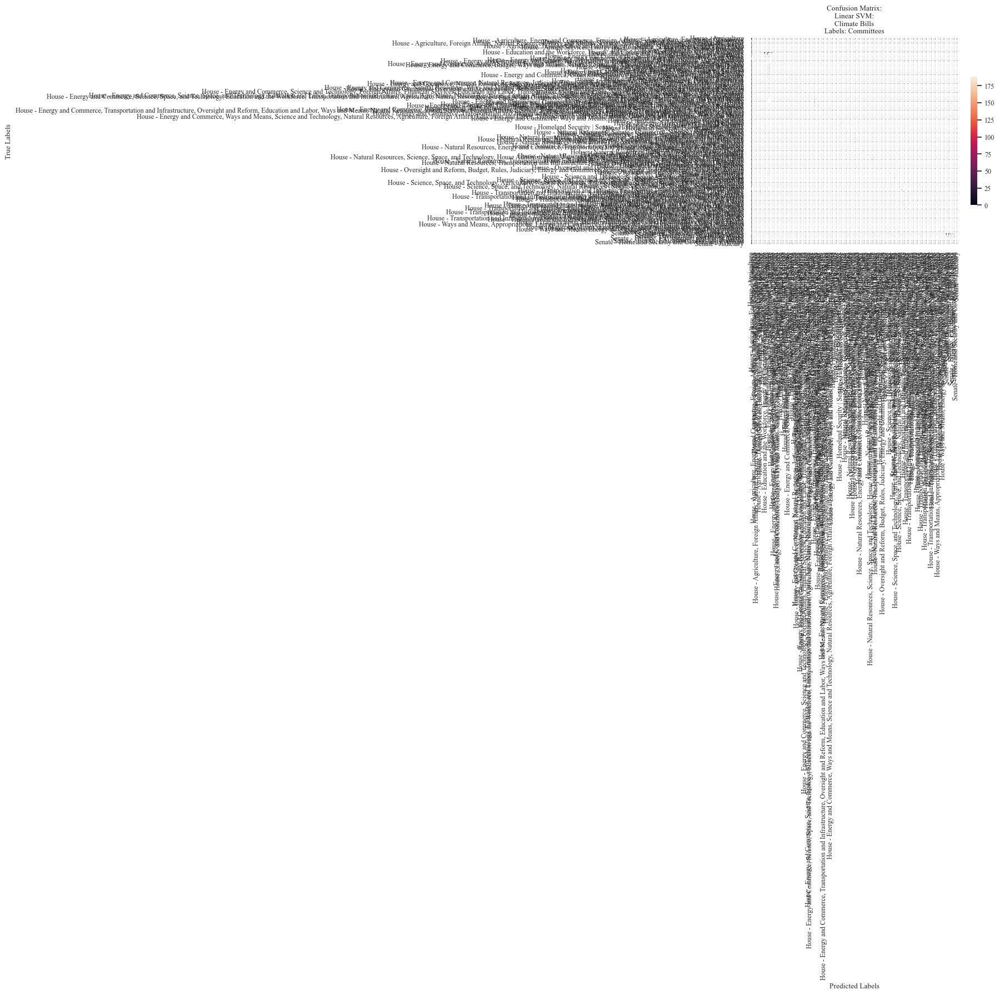

In [58]:
svm_linear_kernel = sklearn.svm.SVC(C=1000, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_bills_committee,
                                                                                                         labels_train = labels_train_bills_committee,
                                                                                                         data_test = data_test_bills_committee,
                                                                                                         labels_test = labels_test_bills_committee,
                                                                                                         label_column_name = 'Committees',
                                                                                                         graph_title = 'Linear SVM:\nClimate Bills',
                                                                                                         labels_name = 'Committees',
                                                                                                         file_name = 'svm - linear - cost 1000 - bills - commitees.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.2.2.4 Bills Data: Metadata

[LibSVM]

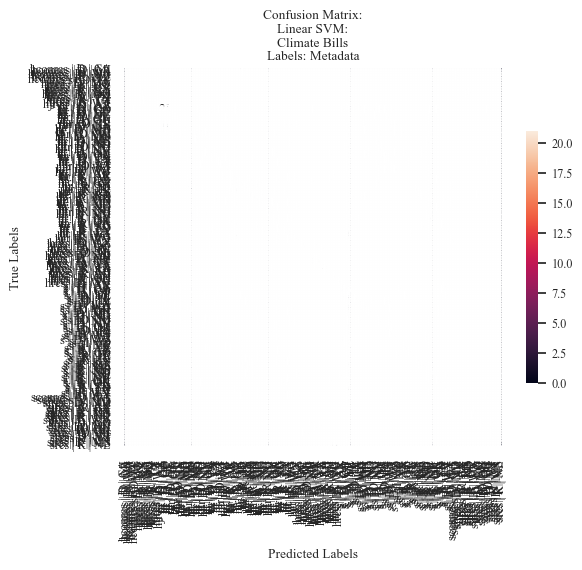

In [59]:
svm_linear_kernel = sklearn.svm.SVC(C=1000, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_bills_combined,
                                                                                                         labels_train = labels_train_bills_combined,
                                                                                                         data_test = data_test_bills_combined,
                                                                                                         labels_test = labels_test_bills_combined,
                                                                                                         label_column_name = 'LABEL',
                                                                                                         graph_title = 'Linear SVM:\nClimate Bills',
                                                                                                         labels_name = 'Metadata',
                                                                                                         file_name = 'svm - linear - cost 1000 - bills - metadata.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.2.2.5 Bills Data: Bill Type

[LibSVM]

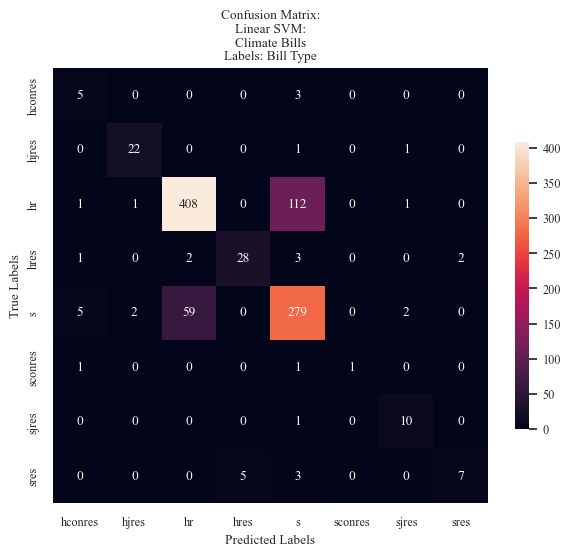

In [60]:
svm_linear_kernel = sklearn.svm.SVC(C=1000, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_bills_type,
                                                                                                         labels_train = labels_train_bills_type,
                                                                                                         data_test = data_test_bills_type,
                                                                                                         labels_test = labels_test_bills_type,
                                                                                                         label_column_name = 'Bill Type',
                                                                                                         graph_title = 'Linear SVM:\nClimate Bills',
                                                                                                         labels_name = 'Bill Type',
                                                                                                         file_name = 'svm - linear - cost 1000 - bills - bill type.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.2.2.6 Bills Data: Sentiment

[LibSVM]

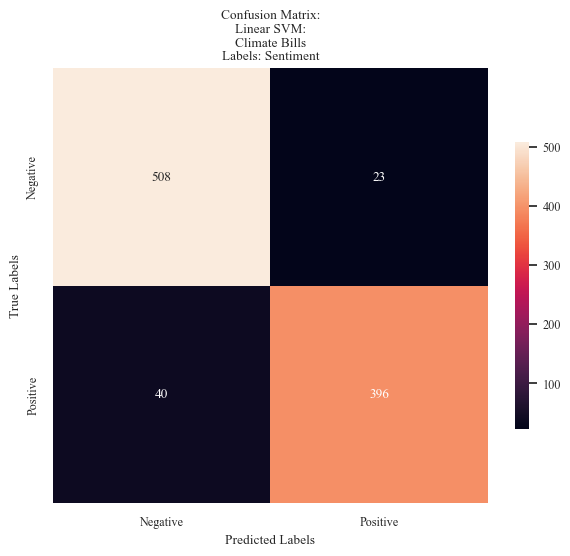

In [61]:
svm_linear_kernel = sklearn.svm.SVC(C=1000, kernel = 'linear', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment = svm_modeler(svm_model = svm_linear_kernel,
                                                                                                         data_train = data_train_bills_sentiment,
                                                                                                         labels_train = labels_train_bills_sentiment,
                                                                                                         data_test = data_test_bills_sentiment,
                                                                                                         labels_test = labels_test_bills_sentiment,
                                                                                                         label_column_name = 'SENTIMENT',
                                                                                                         graph_title = 'Linear SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sentiment',
                                                                                                         file_name = 'svm - linear - cost 1000 - bills - sentiment.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

### 3.2.3 Assessing Validity

In [62]:
data = [['News Headlines: Partisian Affiliation',accuracy_news_data_party, precision_news_data_party, recall_news_data_party],
['News Headlines: Publisher',accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher],
['News Headlines: Sentiment',accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment],
['News Headlines: Publisher and Partisian Affiliation',accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined],
['Climate Bills: Sponsor Affiliation',accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party],
['Climate Bills: Sponsor State',accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state],
['Climate Bills: Metadata',accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined],
['Climate Bills: Bill Type',accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type],
['Climate Bills: Hearing Committee',accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee],
['Climate Bills: Sentiment',accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment]]


for row in data:
    for i in range(1, 4):  # Loop over the columns with numeric data (index 1, 2, 3)
        row[i] = round(row[i], 3)
        
headers = ['', ' Accuracy', 'Precision', 'Recall']

table = tabulate(data, headers=headers, tablefmt='html', numalign='center', stralign = 'left')

with open("SVM Linear Cost 1000 - Model Evaluation.html", "w") as file:
    file.write(table)

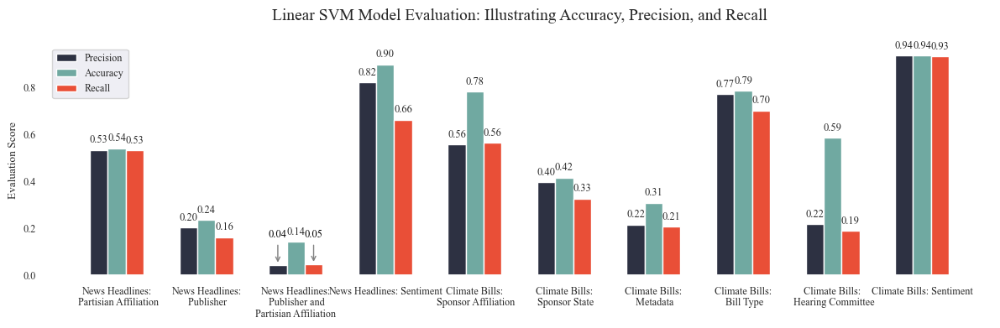

In [63]:
data = [['News Headlines:\n Partisian Affiliation',accuracy_news_data_party, precision_news_data_party, recall_news_data_party],
['News Headlines:\n Publisher',accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher],
['News Headlines:\n Publisher and\nPartisian Affiliation',accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined],
['News Headlines: Sentiment',accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment],
['Climate Bills:\n Sponsor Affiliation',accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party],
['Climate Bills:\n Sponsor State',accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state],
['Climate Bills:\n Metadata',accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined],
['Climate Bills:\n Bill Type',accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type],
['Climate Bills:\n Hearing Committee',accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee],
['Climate Bills: Sentiment',accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment]]


for row in data:
    for i in range(1, 4):  # Loop over the columns with numeric data (index 1, 2, 3)
        row[i] = round(row[i], 3)

model_eval = pd.DataFrame(data, columns=['Model','Accuracy','Precision','Recall'])



fig, ax = plt.subplots(figsize=(12,4))
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=0.8)
ax.set_facecolor('white')

models = model_eval['Model'].to_list()
precision = model_eval['Precision'].to_list()
accuracy = model_eval['Accuracy'].to_list()
recall = model_eval['Recall'].to_list()



ax.set_facecolor('white')

# Width of the bars
bar_width = 0.2


index = np.arange(len(models))

# Plotting bars for Precision, Accuracy, and Recall
bar_precision = ax.bar(index - bar_width, precision, bar_width, label='Precision', color='#2d3142')
bar_accuracy = ax.bar(index, accuracy, bar_width, label='Accuracy', color='#70a9a1')
bar_recall = ax.bar(index + bar_width, recall, bar_width, label='Recall', color='#e94f37')

# Label each bar (with conditional floating & arrow)
def annotate_bars(bars):
    for bar in bars:
        x = bar.get_x() + bar.get_width() / 2
        y = bar.get_height()
        if y < 0.05:
            ax.annotate(
                f'{y:.2f}',
                xy=(x, y),
                xytext=(x, 0.15),
                textcoords='data',
                ha='center', va='bottom',
                arrowprops=dict(arrowstyle='->', color='gray'),
                fontsize=9,
                color='black'
            )
        else:
            ax.text(x, y + 0.02, f'{y:.2f}', ha='center', va='bottom', fontsize=9)

# Apply annotation
annotate_bars(bar_precision)
annotate_bars(bar_accuracy)
annotate_bars(bar_recall)

ax.set_title("Linear SVM Model Evaluation: Illustrating Accuracy, Precision, and Recall\n", fontsize=14)
ax.set_xlabel("")  
ax.set_ylabel("Evaluation Score")
ax.tick_params(axis='x')


ax.set_xticks(index)
ax.set_xticklabels(models)
'''ax.xaxis.set_minor_locator(AutoMinorLocator(5))'''



ax.legend()

plt.tight_layout()

plt.savefig("SVM Linear Cost 1000 - Model Evaluation.png",dpi=1000)
plt.show();

### 3.3 Polynomial Kernel - Cost 100

#### 3.3.1 News Data

#### 3.3.1.1 News Data: Partisianship

[LibSVM]

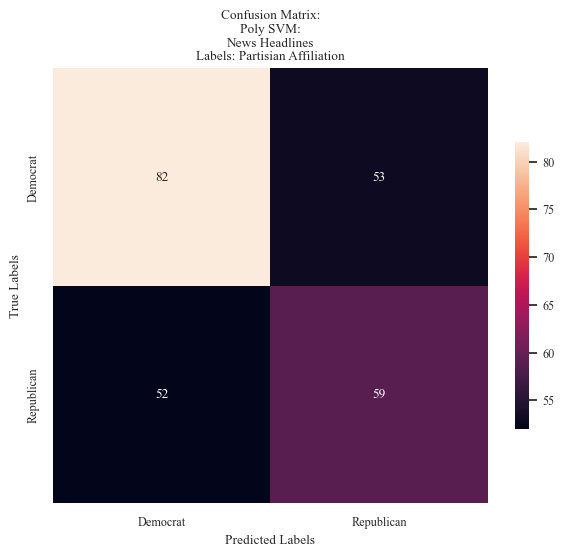

In [64]:
svm_poly_kernel = sklearn.svm.SVC(C=100, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_party, precision_news_data_party, recall_news_data_party = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_news_party,
                                                                                                         labels_train = labels_train_news_party,
                                                                                                         data_test = data_test_news_party,
                                                                                                         labels_test = labels_test_news_party,
                                                                                                         label_column_name = 'Party',
                                                                                                         graph_title = 'Poly SVM:\nNews Headlines',
                                                                                                         labels_name = 'Partisian Affiliation',
                                                                                                         file_name = 'svm - poly - cost 100 - news - party.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.3.1.2 News Data: Publisher

[LibSVM]

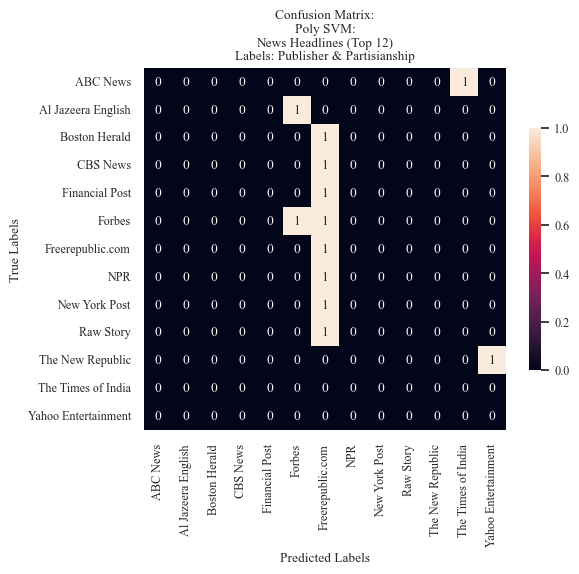

In [65]:
svm_poly_kernel = sklearn.svm.SVC(C=100, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_news_publisher,
                                                                                                         labels_train = labels_train_news_publisher,
                                                                                                         data_test = data_test_news_publisher,
                                                                                                         labels_test = labels_test_news_publisher,
                                                                                                         label_column_name = 'publisher',
                                                                                                         graph_title = 'Poly SVM:\nNews Headlines',
                                                                                                         labels_name = 'Publisher & Partisianship',
                                                                                                         file_name = 'svm - poly - cost 100 - news - metadata.png',
                                                                                                         filter_top_n = True,
                                                                                                         N = 12,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.3.1.3 News Data: Publisher + Partisianship

[LibSVM]

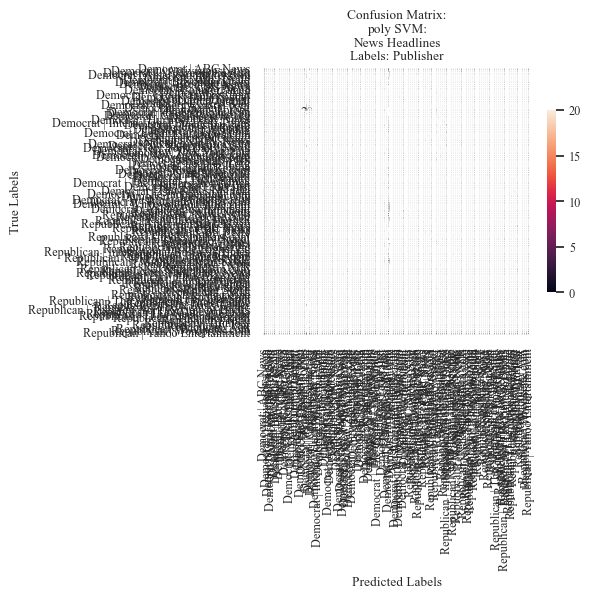

In [66]:
svm_poly_kernel = sklearn.svm.SVC(C=100, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_news_combined,
                                                                                                         labels_train = labels_train_news_combined,
                                                                                                         data_test = data_test_news_combined,
                                                                                                         labels_test = labels_test_news_combined,
                                                                                                         label_column_name = 'LABEL',
                                                                                                         graph_title = 'poly SVM:\nNews Headlines',
                                                                                                         labels_name = 'Publisher',
                                                                                                         file_name = 'svm - poly - cost 100 - news - publisher.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 5,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.3.1.4 News Data: Sentiment

[LibSVM]

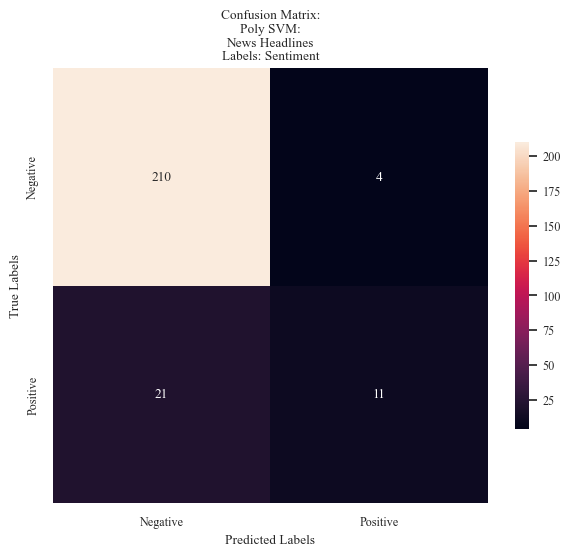

In [67]:
svm_poly_kernel = sklearn.svm.SVC(C=100, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_news_sentiment,
                                                                                                         labels_train = labels_train_news_sentiment,
                                                                                                         data_test = data_test_news_sentiment,
                                                                                                         labels_test = labels_test_news_sentiment,
                                                                                                         label_column_name = 'SENTIMENT',
                                                                                                         graph_title = 'Poly SVM:\nNews Headlines',
                                                                                                         labels_name = 'Sentiment',
                                                                                                         file_name = 'svm - poly - cost 100 - news - sentiment.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.3.2 Proposed Climate Bills

#### 3.3.2.1 Bills Data: Sponsor Affiliation

[LibSVM]

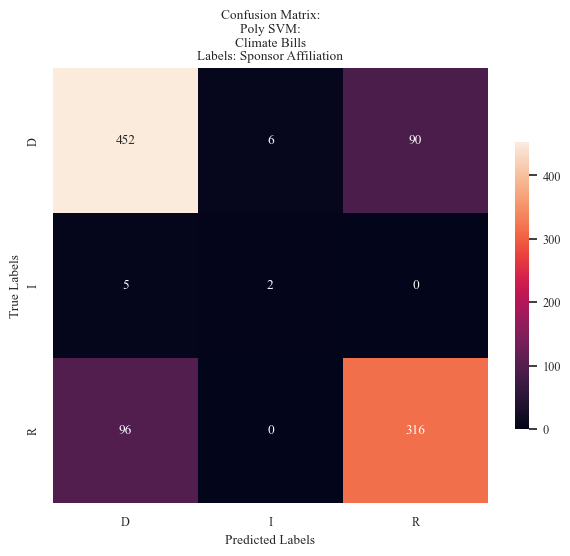

In [68]:
svm_poly_kernel = sklearn.svm.SVC(C=100, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_bills_party,
                                                                                                         labels_train = labels_train_bills_party,
                                                                                                         data_test = data_test_bills_party,
                                                                                                         labels_test = labels_test_bills_party,
                                                                                                         label_column_name = 'Sponser Affiliation',
                                                                                                         graph_title = 'Poly SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sponsor Affiliation',
                                                                                                         file_name = 'svm - poly - cost 100 - bills - sponsor party.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.3.2.2 Bills Data: Sponsor State

[LibSVM]

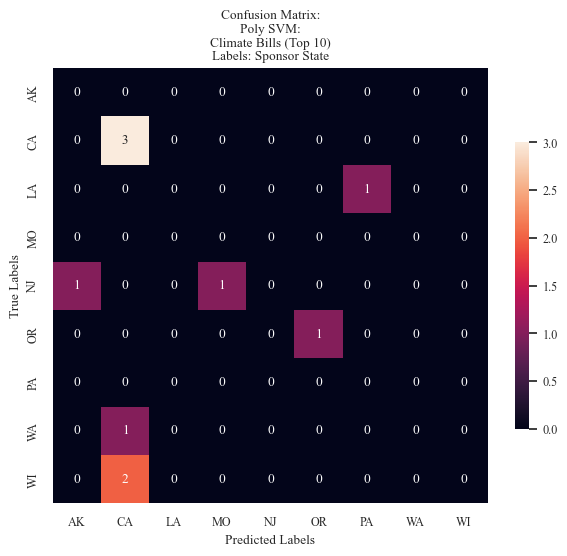

In [69]:
svm_poly_kernel = sklearn.svm.SVC(C=100, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_bills_state,
                                                                                                         labels_train = labels_train_bills_state,
                                                                                                         data_test = data_test_bills_state,
                                                                                                         labels_test = labels_test_bills_state,
                                                                                                         label_column_name = 'Sponser State',
                                                                                                         graph_title = 'Poly SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sponsor State',
                                                                                                         file_name = 'svm - poly - cost 100 - bills - sponsor state.png',
                                                                                                         filter_top_n = True,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.3.2.3 Bills Data: Committee

[LibSVM]

C:\Users\natal\AppData\Local\Temp\ipykernel_16624\1919670016.py:21: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(pad=.5)


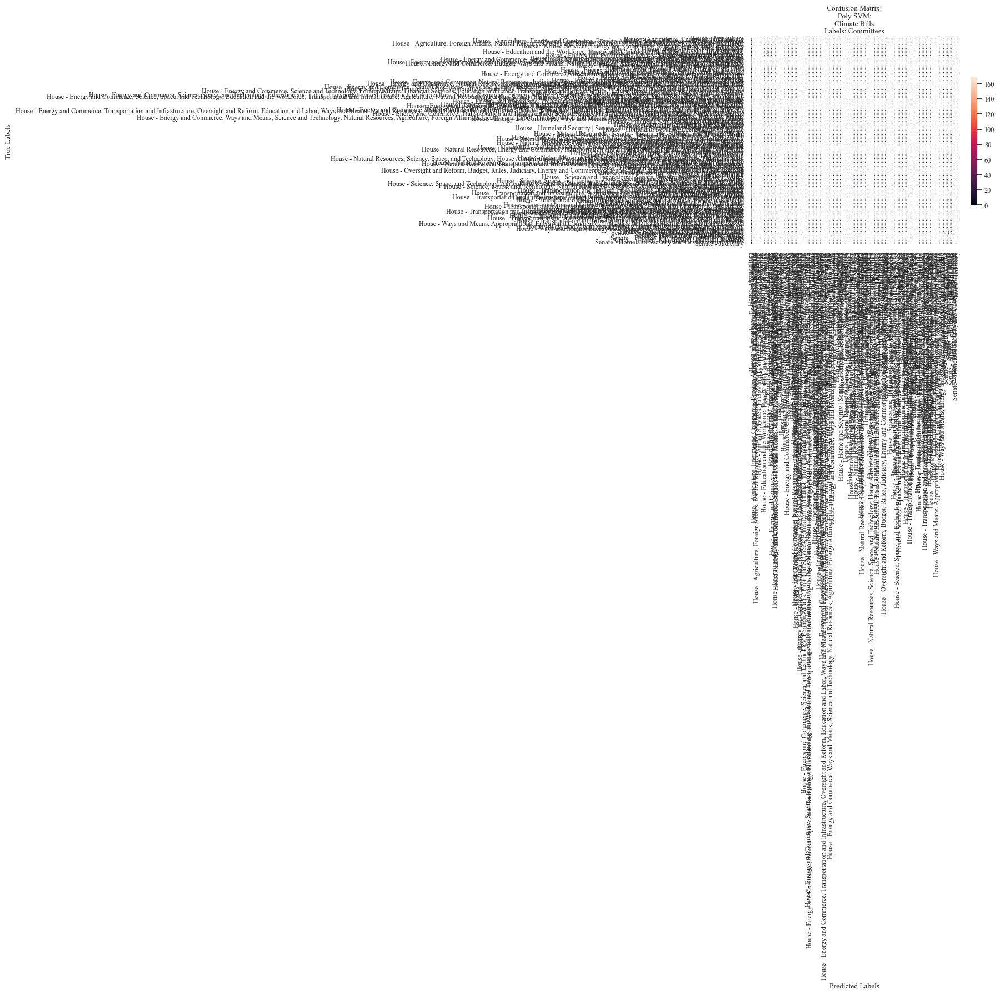

In [70]:
svm_poly_kernel = sklearn.svm.SVC(C=100, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_bills_committee,
                                                                                                         labels_train = labels_train_bills_committee,
                                                                                                         data_test = data_test_bills_committee,
                                                                                                         labels_test = labels_test_bills_committee,
                                                                                                         label_column_name = 'Committees',
                                                                                                         graph_title = 'Poly SVM:\nClimate Bills',
                                                                                                         labels_name = 'Committees',
                                                                                                         file_name = 'svm - poly - cost 100 - bills - commitees.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.3.2.4 Bills Data: Metadata

[LibSVM]

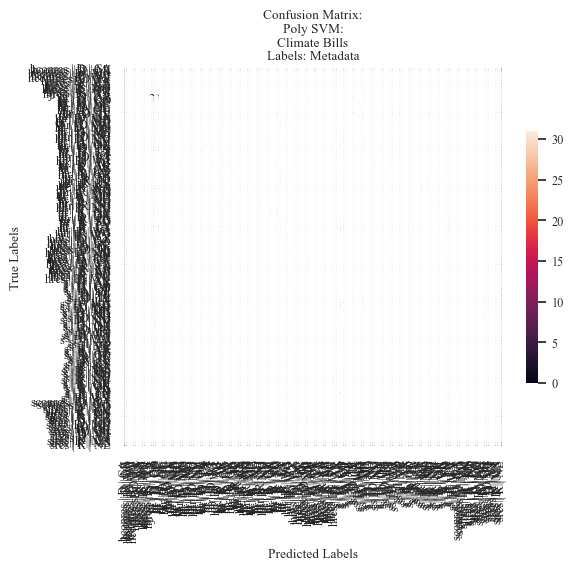

In [71]:
svm_poly_kernel = sklearn.svm.SVC(C=100, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_bills_combined,
                                                                                                         labels_train = labels_train_bills_combined,
                                                                                                         data_test = data_test_bills_combined,
                                                                                                         labels_test = labels_test_bills_combined,
                                                                                                         label_column_name = 'LABEL',
                                                                                                         graph_title = 'Poly SVM:\nClimate Bills',
                                                                                                         labels_name = 'Metadata',
                                                                                                         file_name = 'svm - poly - cost 100 - bills - metadata.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.3.2.5 Bills Data: Bill Type

[LibSVM]

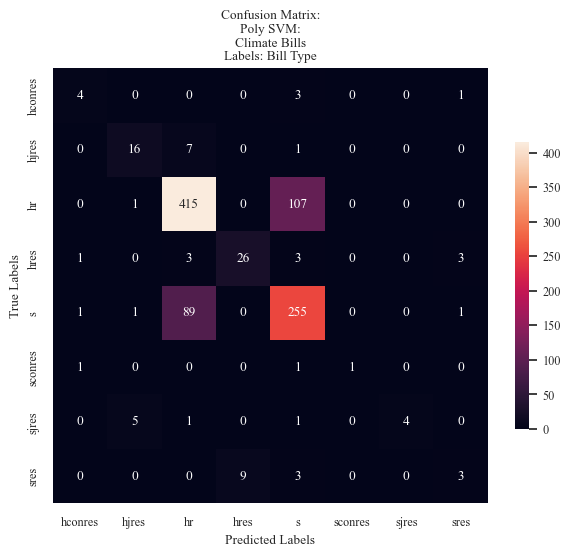

In [72]:
svm_poly_kernel = sklearn.svm.SVC(C=100, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_bills_type,
                                                                                                         labels_train = labels_train_bills_type,
                                                                                                         data_test = data_test_bills_type,
                                                                                                         labels_test = labels_test_bills_type,
                                                                                                         label_column_name = 'Bill Type',
                                                                                                         graph_title = 'Poly SVM:\nClimate Bills',
                                                                                                         labels_name = 'Bill Type',
                                                                                                         file_name = 'svm - poly - cost 100 - bills - bill type.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.3.2.6 Bills Data: Sentiment

[LibSVM]

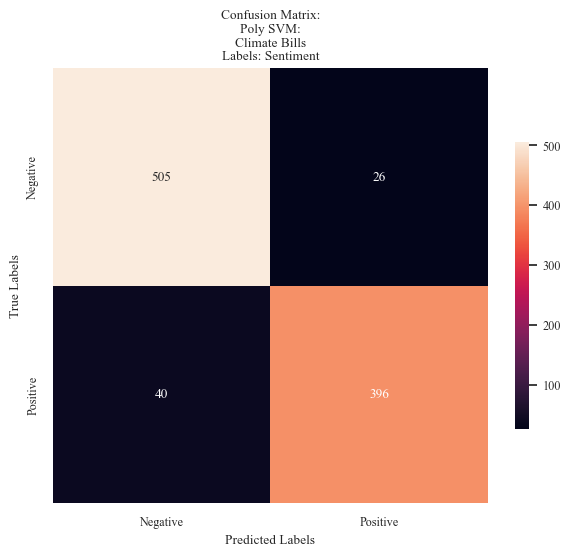

In [73]:
svm_poly_kernel = sklearn.svm.SVC(C=100, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_bills_sentiment,
                                                                                                         labels_train = labels_train_bills_sentiment,
                                                                                                         data_test = data_test_bills_sentiment,
                                                                                                         labels_test = labels_test_bills_sentiment,
                                                                                                         label_column_name = 'SENTIMENT',
                                                                                                         graph_title = 'Poly SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sentiment',
                                                                                                         file_name = 'svm - poly - cost 100 - bills - sentiment.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.3.3 Assessing Validity

In [74]:
data = [['News Headlines: Partisian Affiliation',accuracy_news_data_party, precision_news_data_party, recall_news_data_party],
['News Headlines: Publisher',accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher],
['News Headlines: Sentiment',accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment],
['News Headlines: Publisher and Partisian Affiliation',accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined],
['Climate Bills: Sponsor Affiliation',accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party],
['Climate Bills: Sponsor State',accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state],
['Climate Bills: Metadata',accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined],
['Climate Bills: Bill Type',accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type],
['Climate Bills: Hearing Committee',accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee],
['Climate Bills: Sentiment',accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment]]


for row in data:
    for i in range(1, 4):  # Loop over the columns with numeric data (index 1, 2, 3)
        row[i] = round(row[i], 3)
        
headers = ['', ' Accuracy', 'Precision', 'Recall']

table = tabulate(data, headers=headers, tablefmt='html', numalign='center', stralign = 'left')

with open("SVM Poly - cost 100 - Model Evaluation.html", "w") as file:
    file.write(table)

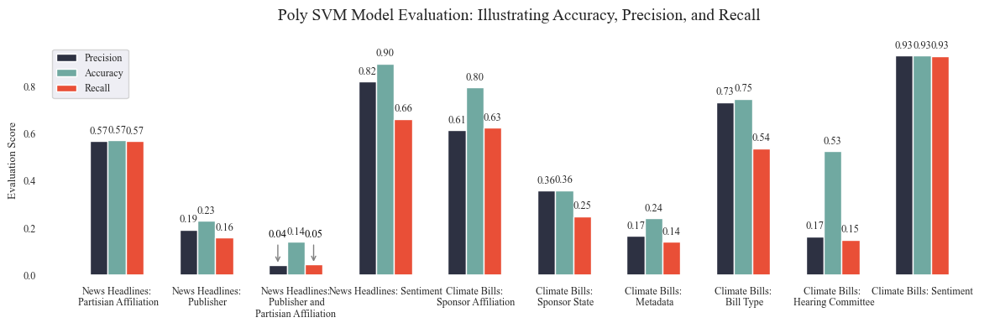

In [75]:
data = [['News Headlines:\n Partisian Affiliation',accuracy_news_data_party, precision_news_data_party, recall_news_data_party],
['News Headlines:\n Publisher',accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher],
['News Headlines:\n Publisher and\nPartisian Affiliation',accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined],
['News Headlines: Sentiment',accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment],
['Climate Bills:\n Sponsor Affiliation',accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party],
['Climate Bills:\n Sponsor State',accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state],
['Climate Bills:\n Metadata',accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined],
['Climate Bills:\n Bill Type',accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type],
['Climate Bills:\n Hearing Committee',accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee],
['Climate Bills: Sentiment',accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment]]


for row in data:
    for i in range(1, 4):  # Loop over the columns with numeric data (index 1, 2, 3)
        row[i] = round(row[i], 3)

model_eval = pd.DataFrame(data, columns=['Model','Accuracy','Precision','Recall'])



fig, ax = plt.subplots(figsize=(12,4))
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=0.8)
ax.set_facecolor('white')

models = model_eval['Model'].to_list()
precision = model_eval['Precision'].to_list()
accuracy = model_eval['Accuracy'].to_list()
recall = model_eval['Recall'].to_list()



ax.set_facecolor('white')

# Width of the bars
bar_width = 0.2


index = np.arange(len(models))

# Plotting bars for Precision, Accuracy, and Recall
bar_precision = ax.bar(index - bar_width, precision, bar_width, label='Precision', color='#2d3142')
bar_accuracy = ax.bar(index, accuracy, bar_width, label='Accuracy', color='#70a9a1')
bar_recall = ax.bar(index + bar_width, recall, bar_width, label='Recall', color='#e94f37')

# Label each bar (with conditional floating & arrow)
def annotate_bars(bars):
    for bar in bars:
        x = bar.get_x() + bar.get_width() / 2
        y = bar.get_height()
        if y < 0.05:
            ax.annotate(
                f'{y:.2f}',
                xy=(x, y),
                xytext=(x, 0.15),
                textcoords='data',
                ha='center', va='bottom',
                arrowprops=dict(arrowstyle='->', color='gray'),
                fontsize=9,
                color='black'
            )
        else:
            ax.text(x, y + 0.02, f'{y:.2f}', ha='center', va='bottom', fontsize=9)

# Apply annotation
annotate_bars(bar_precision)
annotate_bars(bar_accuracy)
annotate_bars(bar_recall)

ax.set_title("Poly SVM Model Evaluation: Illustrating Accuracy, Precision, and Recall\n", fontsize=14)
ax.set_xlabel("")  
ax.set_ylabel("Evaluation Score")
ax.tick_params(axis='x')


ax.set_xticks(index)
ax.set_xticklabels(models)
'''ax.xaxis.set_minor_locator(AutoMinorLocator(5))'''



ax.legend()

plt.tight_layout()

plt.savefig("SVM Poly - cost 100 - Model Evaluation.png",dpi=1000)
plt.show();

### 3.4 Polymoial Kernel - Cost 1000

#### 3.4.1 News Data

#### 3.4.1.1 News Data: Partisianship

[LibSVM]

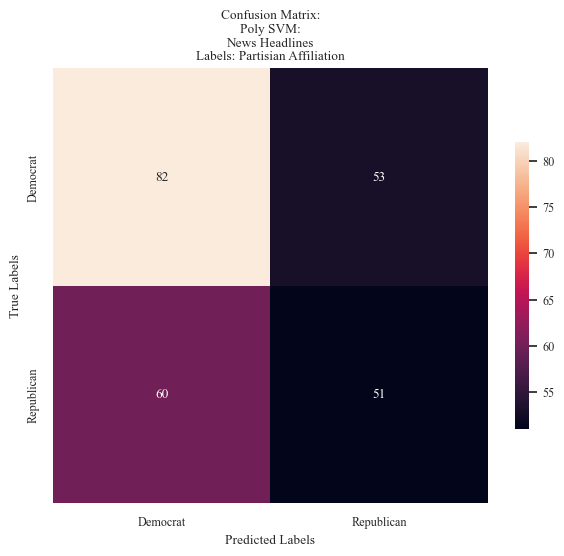

In [76]:
svm_poly_kernel = sklearn.svm.SVC(C=1000, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_party, precision_news_data_party, recall_news_data_party = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_news_party,
                                                                                                         labels_train = labels_train_news_party,
                                                                                                         data_test = data_test_news_party,
                                                                                                         labels_test = labels_test_news_party,
                                                                                                         label_column_name = 'Party',
                                                                                                         graph_title = 'Poly SVM:\nNews Headlines',
                                                                                                         labels_name = 'Partisian Affiliation',
                                                                                                         file_name = 'svm - poly - cost 1000 - news - party.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.4.1.2 News Data: Publisher

[LibSVM]

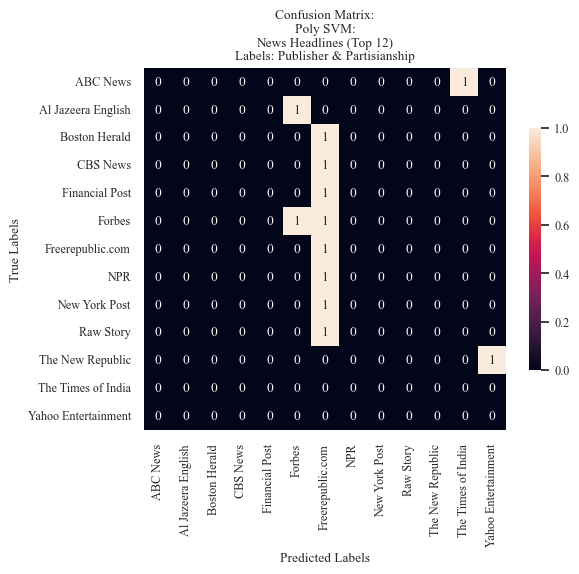

In [77]:
svm_poly_kernel = sklearn.svm.SVC(C=1000, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_news_publisher,
                                                                                                         labels_train = labels_train_news_publisher,
                                                                                                         data_test = data_test_news_publisher,
                                                                                                         labels_test = labels_test_news_publisher,
                                                                                                         label_column_name = 'publisher',
                                                                                                         graph_title = 'Poly SVM:\nNews Headlines',
                                                                                                         labels_name = 'Publisher & Partisianship',
                                                                                                         file_name = 'svm - poly - cost 1000 - news - metadata.png',
                                                                                                         filter_top_n = True,
                                                                                                         N = 12,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.4.1.3 News Data: Publisher + Partisianship

[LibSVM]

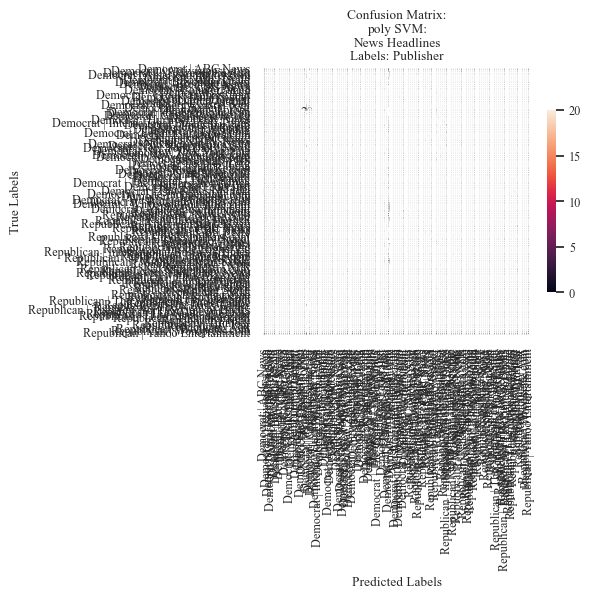

In [78]:
svm_poly_kernel = sklearn.svm.SVC(C=1000, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_news_combined,
                                                                                                         labels_train = labels_train_news_combined,
                                                                                                         data_test = data_test_news_combined,
                                                                                                         labels_test = labels_test_news_combined,
                                                                                                         label_column_name = 'LABEL',
                                                                                                         graph_title = 'poly SVM:\nNews Headlines',
                                                                                                         labels_name = 'Publisher',
                                                                                                         file_name = 'svm - poly - cost 1000 - news - publisher.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 5,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.4.1.4 News Data: Sentiment

[LibSVM]

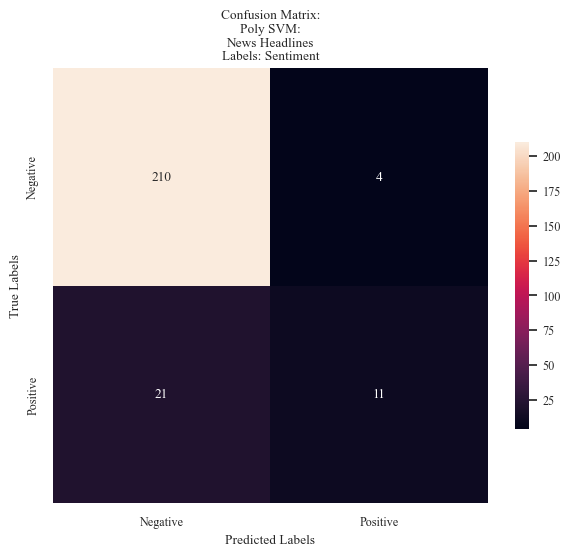

In [79]:
svm_poly_kernel = sklearn.svm.SVC(C=1000, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_news_sentiment,
                                                                                                         labels_train = labels_train_news_sentiment,
                                                                                                         data_test = data_test_news_sentiment,
                                                                                                         labels_test = labels_test_news_sentiment,
                                                                                                         label_column_name = 'SENTIMENT',
                                                                                                         graph_title = 'Poly SVM:\nNews Headlines',
                                                                                                         labels_name = 'Sentiment',
                                                                                                         file_name = 'svm - poly - cost 1000 - news - sentiment.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.4.2. Proposed Cliamte Bills:

#### 3.4.2.1 Bills Data: Sponsor Affiliation

[LibSVM]

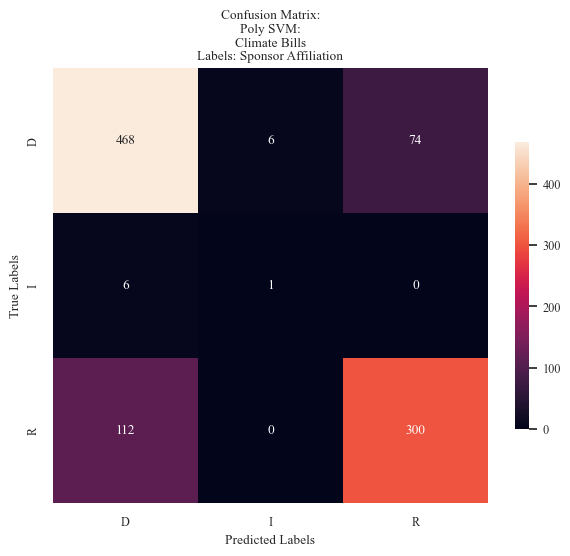

In [80]:
svm_poly_kernel = sklearn.svm.SVC(C=1000, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_bills_party,
                                                                                                         labels_train = labels_train_bills_party,
                                                                                                         data_test = data_test_bills_party,
                                                                                                         labels_test = labels_test_bills_party,
                                                                                                         label_column_name = 'Sponser Affiliation',
                                                                                                         graph_title = 'Poly SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sponsor Affiliation',
                                                                                                         file_name = 'svm - poly - cost 1000 - bills - sponsor party.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.4.2.2 Bills Data: Sponsor State

[LibSVM]

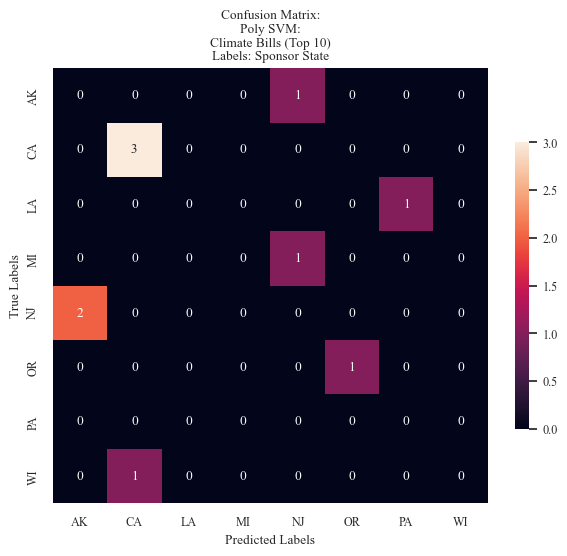

In [81]:
svm_poly_kernel = sklearn.svm.SVC(C=1000, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_bills_state,
                                                                                                         labels_train = labels_train_bills_state,
                                                                                                         data_test = data_test_bills_state,
                                                                                                         labels_test = labels_test_bills_state,
                                                                                                         label_column_name = 'Sponser State',
                                                                                                         graph_title = 'Poly SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sponsor State',
                                                                                                         file_name = 'svm - poly - cost 1000 - bills - sponsor state.png',
                                                                                                         filter_top_n = True,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.4.2.3 Bills Data:  Committee

[LibSVM]

C:\Users\natal\AppData\Local\Temp\ipykernel_16624\1919670016.py:21: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(pad=.5)


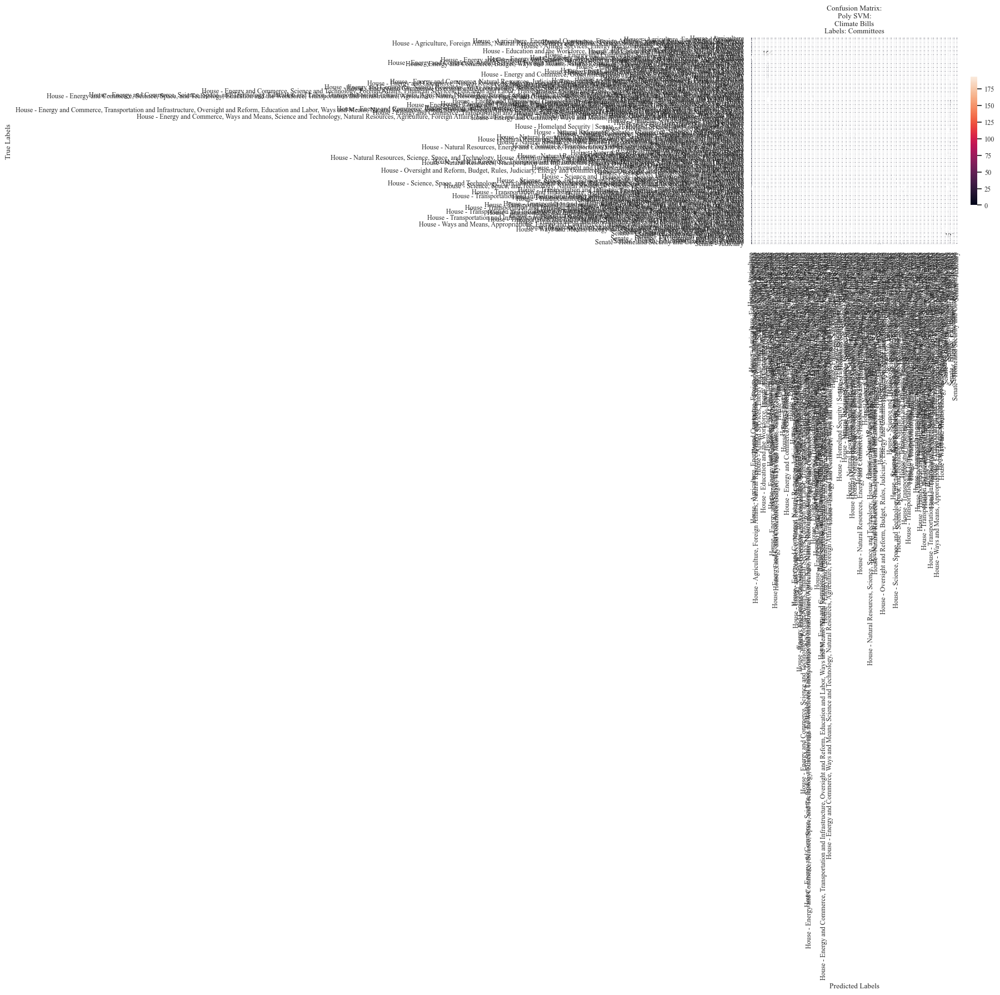

In [82]:
svm_poly_kernel = sklearn.svm.SVC(C=1000, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_bills_committee,
                                                                                                         labels_train = labels_train_bills_committee,
                                                                                                         data_test = data_test_bills_committee,
                                                                                                         labels_test = labels_test_bills_committee,
                                                                                                         label_column_name = 'Committees',
                                                                                                         graph_title = 'Poly SVM:\nClimate Bills',
                                                                                                         labels_name = 'Committees',
                                                                                                         file_name = 'svm - poly - cost 1000 - bills - commitees.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.4.2.4 Bills Data: Metadata

[LibSVM]

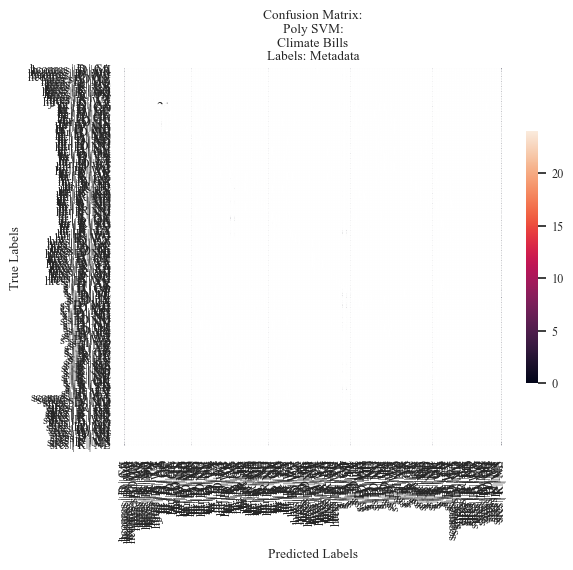

In [83]:
svm_poly_kernel = sklearn.svm.SVC(C=1000, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_bills_combined,
                                                                                                         labels_train = labels_train_bills_combined,
                                                                                                         data_test = data_test_bills_combined,
                                                                                                         labels_test = labels_test_bills_combined,
                                                                                                         label_column_name = 'LABEL',
                                                                                                         graph_title = 'Poly SVM:\nClimate Bills',
                                                                                                         labels_name = 'Metadata',
                                                                                                         file_name = 'svm - poly - cost 1000 - bills - metadata.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.4.2.5 Bills Data: Bill Type

[LibSVM]

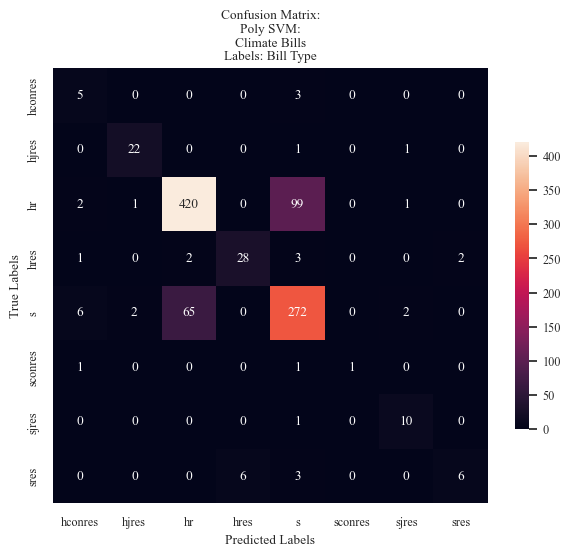

In [84]:
svm_poly_kernel = sklearn.svm.SVC(C=1000, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_bills_type,
                                                                                                         labels_train = labels_train_bills_type,
                                                                                                         data_test = data_test_bills_type,
                                                                                                         labels_test = labels_test_bills_type,
                                                                                                         label_column_name = 'Bill Type',
                                                                                                         graph_title = 'Poly SVM:\nClimate Bills',
                                                                                                         labels_name = 'Bill Type',
                                                                                                         file_name = 'svm - poly - cost 1000 - bills - bill type.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.4.2. Bills Data: Sentiment

[LibSVM]

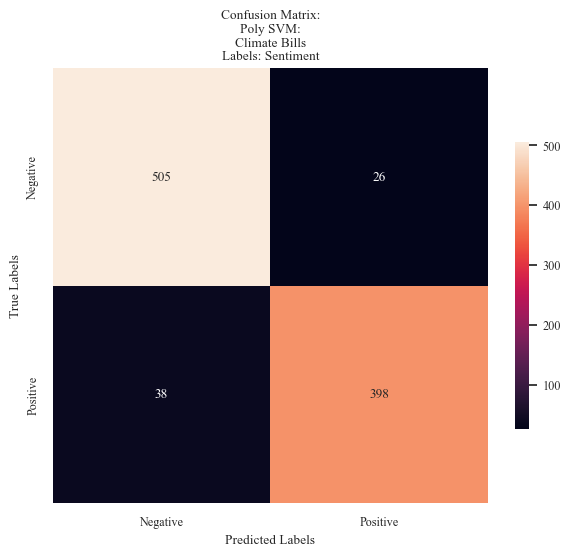

In [85]:
svm_poly_kernel = sklearn.svm.SVC(C=1000, kernel = 'poly', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment = svm_modeler(svm_model = svm_poly_kernel,
                                                                                                         data_train = data_train_bills_sentiment,
                                                                                                         labels_train = labels_train_bills_sentiment,
                                                                                                         data_test = data_test_bills_sentiment,
                                                                                                         labels_test = labels_test_bills_sentiment,
                                                                                                         label_column_name = 'SENTIMENT',
                                                                                                         graph_title = 'Poly SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sentiment',
                                                                                                         file_name = 'svm - poly - cost 1000 - bills - sentiment.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.4.3 Assessing Validity

In [86]:
data = [['News Headlines: Partisian Affiliation',accuracy_news_data_party, precision_news_data_party, recall_news_data_party],
['News Headlines: Publisher',accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher],
['News Headlines: Sentiment',accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment],
['News Headlines: Publisher and Partisian Affiliation',accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined],
['Climate Bills: Sponsor Affiliation',accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party],
['Climate Bills: Sponsor State',accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state],
['Climate Bills: Metadata',accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined],
['Climate Bills: Bill Type',accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type],
['Climate Bills: Hearing Committee',accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee],
['Climate Bills: Sentiment',accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment]]


for row in data:
    for i in range(1, 4):  # Loop over the columns with numeric data (index 1, 2, 3)
        row[i] = round(row[i], 3)
        
headers = ['', ' Accuracy', 'Precision', 'Recall']

table = tabulate(data, headers=headers, tablefmt='html', numalign='center', stralign = 'left')

with open("SVM Poly - cost 1000 - Model Evaluation.html", "w") as file:
    file.write(table)

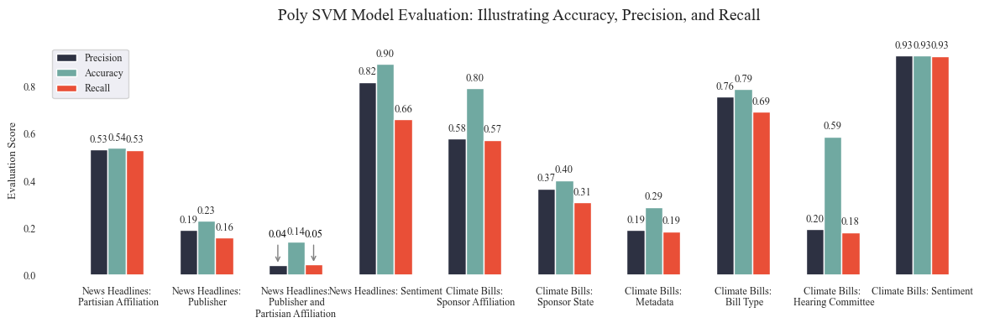

In [87]:
data = [['News Headlines:\n Partisian Affiliation',accuracy_news_data_party, precision_news_data_party, recall_news_data_party],
['News Headlines:\n Publisher',accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher],
['News Headlines:\n Publisher and\nPartisian Affiliation',accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined],
['News Headlines: Sentiment',accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment],
['Climate Bills:\n Sponsor Affiliation',accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party],
['Climate Bills:\n Sponsor State',accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state],
['Climate Bills:\n Metadata',accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined],
['Climate Bills:\n Bill Type',accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type],
['Climate Bills:\n Hearing Committee',accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee],
['Climate Bills: Sentiment',accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment]]


for row in data:
    for i in range(1, 4):  # Loop over the columns with numeric data (index 1, 2, 3)
        row[i] = round(row[i], 3)

model_eval = pd.DataFrame(data, columns=['Model','Accuracy','Precision','Recall'])



fig, ax = plt.subplots(figsize=(12,4))
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=0.8)
ax.set_facecolor('white')

models = model_eval['Model'].to_list()
precision = model_eval['Precision'].to_list()
accuracy = model_eval['Accuracy'].to_list()
recall = model_eval['Recall'].to_list()



ax.set_facecolor('white')

# Width of the bars
bar_width = 0.2


index = np.arange(len(models))

# Plotting bars for Precision, Accuracy, and Recall
bar_precision = ax.bar(index - bar_width, precision, bar_width, label='Precision', color='#2d3142')
bar_accuracy = ax.bar(index, accuracy, bar_width, label='Accuracy', color='#70a9a1')
bar_recall = ax.bar(index + bar_width, recall, bar_width, label='Recall', color='#e94f37')

# Label each bar (with conditional floating & arrow)
def annotate_bars(bars):
    for bar in bars:
        x = bar.get_x() + bar.get_width() / 2
        y = bar.get_height()
        if y < 0.05:
            ax.annotate(
                f'{y:.2f}',
                xy=(x, y),
                xytext=(x, 0.15),
                textcoords='data',
                ha='center', va='bottom',
                arrowprops=dict(arrowstyle='->', color='gray'),
                fontsize=9,
                color='black'
            )
        else:
            ax.text(x, y + 0.02, f'{y:.2f}', ha='center', va='bottom', fontsize=9)

# Apply annotation
annotate_bars(bar_precision)
annotate_bars(bar_accuracy)
annotate_bars(bar_recall)

ax.set_title("Poly SVM Model Evaluation: Illustrating Accuracy, Precision, and Recall\n", fontsize=14)
ax.set_xlabel("")  
ax.set_ylabel("Evaluation Score")
ax.tick_params(axis='x')


ax.set_xticks(index)
ax.set_xticklabels(models)
'''ax.xaxis.set_minor_locator(AutoMinorLocator(5))'''



ax.legend()

plt.tight_layout()

plt.savefig("SVM Poly - cost 1000 - Model Evaluation.png",dpi=1000)
plt.show();

### 3.5 RBF Kernel - Cost 100

#### 3.5.1 News Data

#### 3.5.1.1 News Data: Partisianship

[LibSVM]

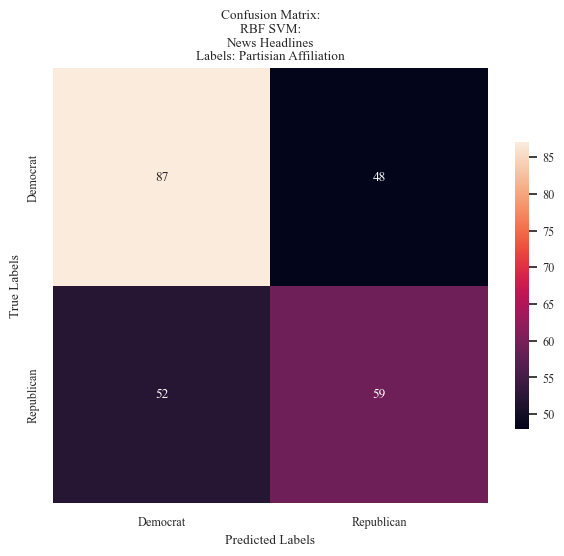

In [100]:
svm_rbf_kernel = sklearn.svm.SVC(C=100, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_party, precision_news_data_party, recall_news_data_party = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_news_party,
                                                                                                         labels_train = labels_train_news_party,
                                                                                                         data_test = data_test_news_party,
                                                                                                         labels_test = labels_test_news_party,
                                                                                                         label_column_name = 'Party',
                                                                                                         graph_title = 'RBF SVM:\nNews Headlines',
                                                                                                         labels_name = 'Partisian Affiliation',
                                                                                                         file_name = 'svm - rbf - cost 100 - news - party.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.5.1.2 News Data: Publisher

[LibSVM]

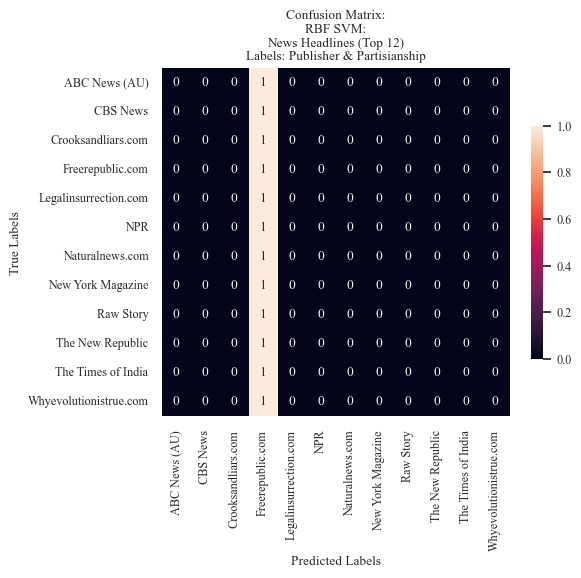

In [101]:
svm_rbf_kernel = sklearn.svm.SVC(C=100, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_news_publisher,
                                                                                                         labels_train = labels_train_news_publisher,
                                                                                                         data_test = data_test_news_publisher,
                                                                                                         labels_test = labels_test_news_publisher,
                                                                                                         label_column_name = 'publisher',
                                                                                                         graph_title = 'RBF SVM:\nNews Headlines',
                                                                                                         labels_name = 'Publisher & Partisianship',
                                                                                                         file_name = 'svm - rbf - cost 100 - news - metadata.png',
                                                                                                         filter_top_n = True,
                                                                                                         N = 12,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.5.1.3 News Data: Publisher + Partisianship

[LibSVM]

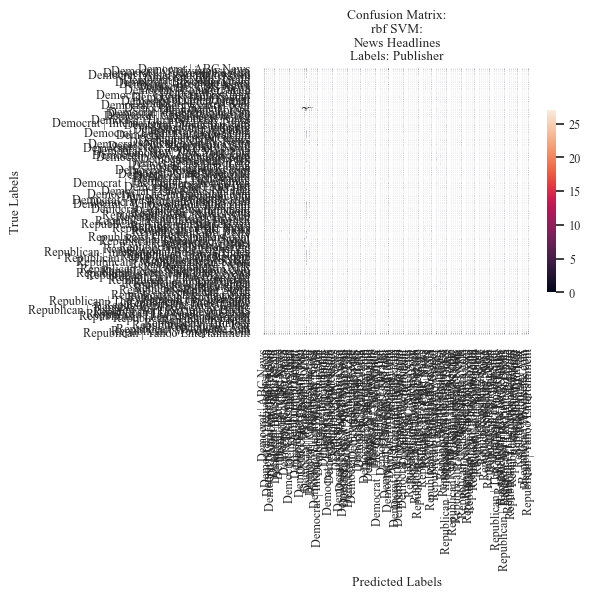

In [102]:
svm_rbf_kernel = sklearn.svm.SVC(C=100, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_news_combined,
                                                                                                         labels_train = labels_train_news_combined,
                                                                                                         data_test = data_test_news_combined,
                                                                                                         labels_test = labels_test_news_combined,
                                                                                                         label_column_name = 'LABEL',
                                                                                                         graph_title = 'rbf SVM:\nNews Headlines',
                                                                                                         labels_name = 'Publisher',
                                                                                                         file_name = 'svm - rbf - cost 100 - news - publisher.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 5,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.5.1.4 News Data: Sentiment

[LibSVM]

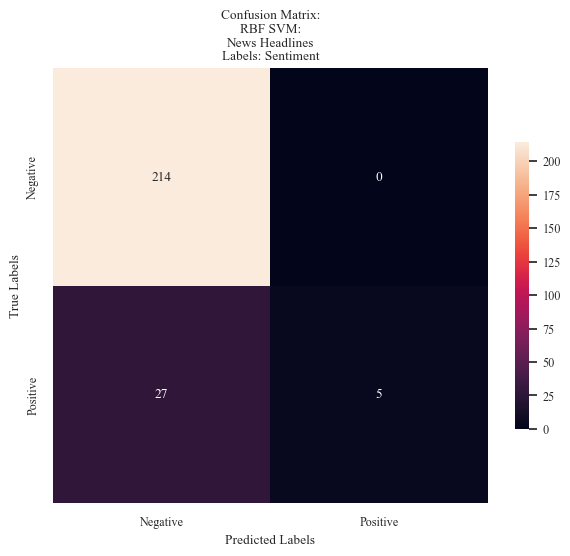

In [108]:
svm_rbf_kernel = sklearn.svm.SVC(C=100, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_news_sentiment,
                                                                                                         labels_train = labels_train_news_sentiment,
                                                                                                         data_test = data_test_news_sentiment,
                                                                                                         labels_test = labels_test_news_sentiment,
                                                                                                         label_column_name = 'SENTIMENT',
                                                                                                         graph_title = 'RBF SVM:\nNews Headlines',
                                                                                                         labels_name = 'Sentiment',
                                                                                                         file_name = 'svm - rbf - cost 100 - news - sentiment.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.5.2 Proposed Climate Bills

#### 3.5.2.1 Bills Data: Sponsor Affiliation

[LibSVM]

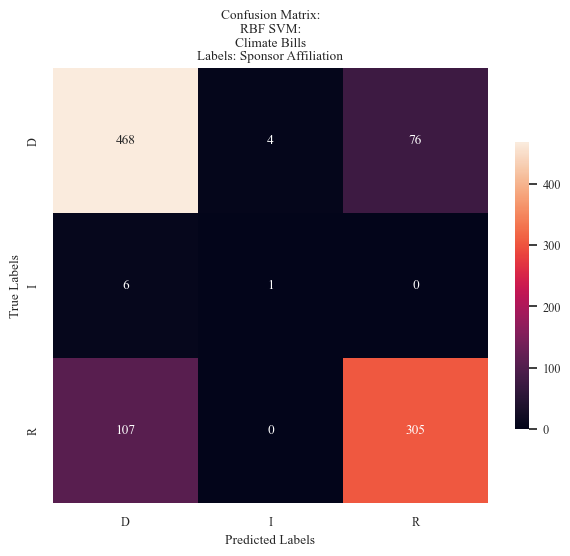

In [103]:
svm_rbf_kernel = sklearn.svm.SVC(C=100, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_bills_party,
                                                                                                         labels_train = labels_train_bills_party,
                                                                                                         data_test = data_test_bills_party,
                                                                                                         labels_test = labels_test_bills_party,
                                                                                                         label_column_name = 'Sponser Affiliation',
                                                                                                         graph_title = 'RBF SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sponsor Affiliation',
                                                                                                         file_name = 'svm - rbf - cost 100 - bills - sponsor party.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.5.2.2 Bills Data: Sponsor State

[LibSVM]

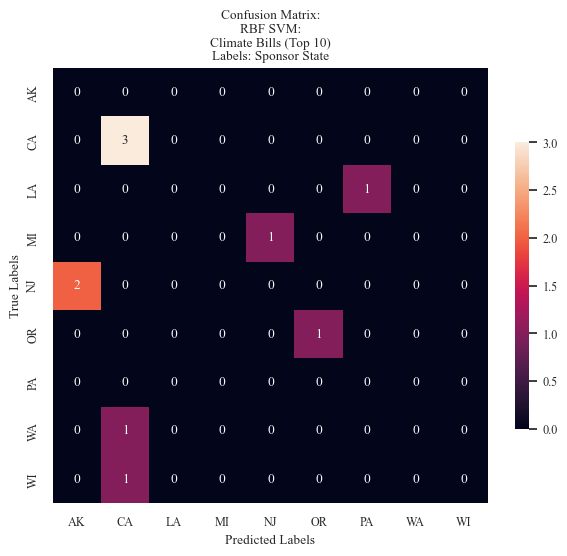

In [104]:
svm_rbf_kernel = sklearn.svm.SVC(C=100, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_bills_state,
                                                                                                         labels_train = labels_train_bills_state,
                                                                                                         data_test = data_test_bills_state,
                                                                                                         labels_test = labels_test_bills_state,
                                                                                                         label_column_name = 'Sponser State',
                                                                                                         graph_title = 'RBF SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sponsor State',
                                                                                                         file_name = 'svm - rbf - cost 100 - bills - sponsor state.png',
                                                                                                         filter_top_n = True,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.5.2.3 Bills Data: Committee

[LibSVM]

C:\Users\natal\AppData\Local\Temp\ipykernel_16624\1919670016.py:21: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(pad=.5)


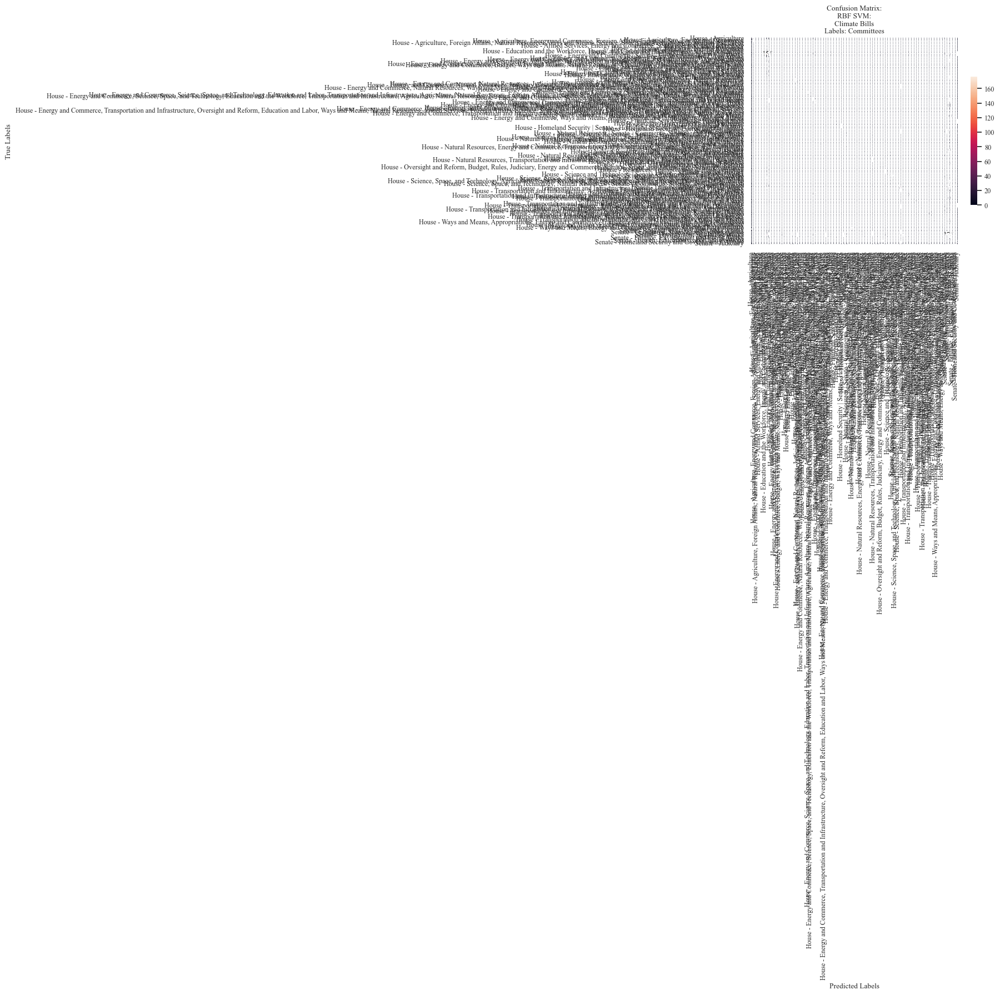

In [105]:
svm_rbf_kernel = sklearn.svm.SVC(C=100, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_bills_committee,
                                                                                                         labels_train = labels_train_bills_committee,
                                                                                                         data_test = data_test_bills_committee,
                                                                                                         labels_test = labels_test_bills_committee,
                                                                                                         label_column_name = 'Committees',
                                                                                                         graph_title = 'RBF SVM:\nClimate Bills',
                                                                                                         labels_name = 'Committees',
                                                                                                         file_name = 'svm - rbf - cost 100 - bills - commitees.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.5.2.4 Bills Data: Metadata

[LibSVM]

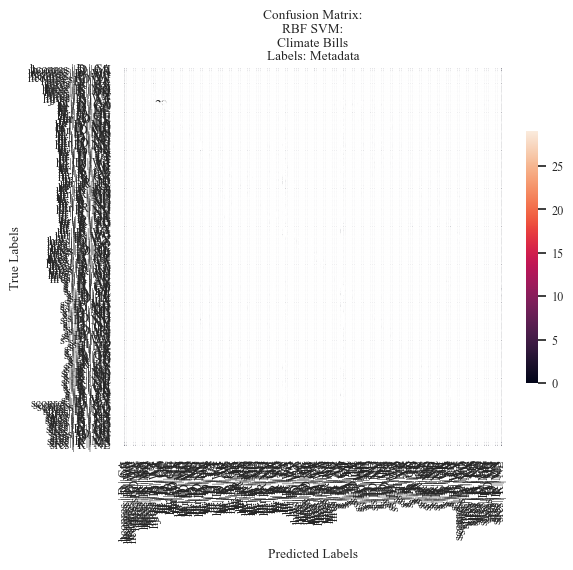

In [106]:
svm_rbf_kernel = sklearn.svm.SVC(C=100, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_bills_combined,
                                                                                                         labels_train = labels_train_bills_combined,
                                                                                                         data_test = data_test_bills_combined,
                                                                                                         labels_test = labels_test_bills_combined,
                                                                                                         label_column_name = 'LABEL',
                                                                                                         graph_title = 'RBF SVM:\nClimate Bills',
                                                                                                         labels_name = 'Metadata',
                                                                                                         file_name = 'svm - rbf - cost 100 - bills - metadata.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.5.2.5 Bills Data: Bill Type

[LibSVM]

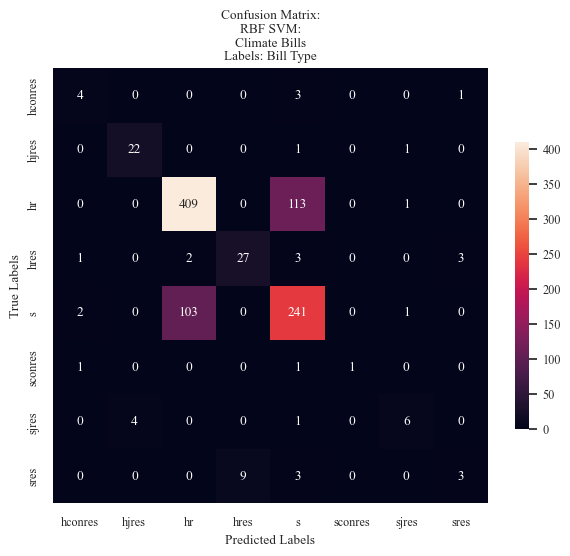

In [109]:
svm_rbf_kernel = sklearn.svm.SVC(C=100, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_bills_type,
                                                                                                         labels_train = labels_train_bills_type,
                                                                                                         data_test = data_test_bills_type,
                                                                                                         labels_test = labels_test_bills_type,
                                                                                                         label_column_name = 'Bill Type',
                                                                                                         graph_title = 'RBF SVM:\nClimate Bills',
                                                                                                         labels_name = 'Bill Type',
                                                                                                         file_name = 'svm - rbf - cost 100 - bills - bill type.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.5.2.6 Bills Data: Sentiment

[LibSVM]

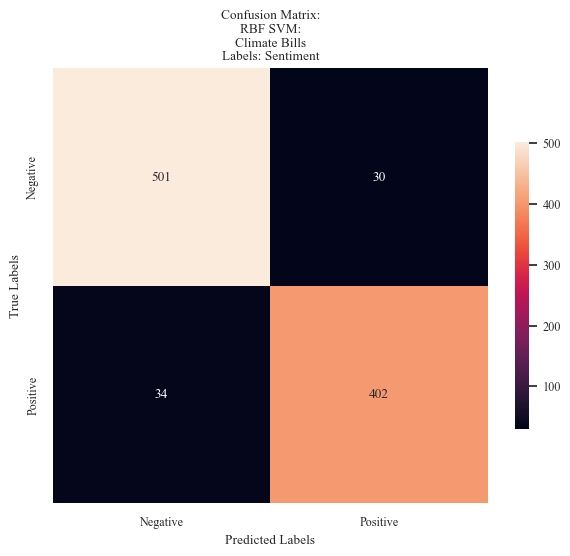

In [110]:
svm_rbf_kernel = sklearn.svm.SVC(C=100, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_bills_sentiment,
                                                                                                         labels_train = labels_train_bills_sentiment,
                                                                                                         data_test = data_test_bills_sentiment,
                                                                                                         labels_test = labels_test_bills_sentiment,
                                                                                                         label_column_name = 'SENTIMENT',
                                                                                                         graph_title = 'RBF SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sentiment',
                                                                                                         file_name = 'svm - rbf - cost 100 - bills - sentiment.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.5.3 Assessing Validity

In [111]:
data = [['News Headlines: Partisian Affiliation',accuracy_news_data_party, precision_news_data_party, recall_news_data_party],
['News Headlines: Publisher',accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher],
['News Headlines: Sentiment',accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment],
['News Headlines: Publisher and Partisian Affiliation',accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined],
['Climate Bills: Sponsor Affiliation',accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party],
['Climate Bills: Sponsor State',accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state],
['Climate Bills: Metadata',accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined],
['Climate Bills: Bill Type',accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type],
['Climate Bills: Hearing Committee',accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee],
['Climate Bills: Sentiment',accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment]]


for row in data:
    for i in range(1, 4):  # Loop over the columns with numeric data (index 1, 2, 3)
        row[i] = round(row[i], 3)
        
headers = ['', ' Accuracy', 'Precision', 'Recall']

table = tabulate(data, headers=headers, tablefmt='html', numalign='center', stralign = 'left')

with open("SVM RBF - cost 100 - Model Evaluation.html", "w") as file:
    file.write(table)

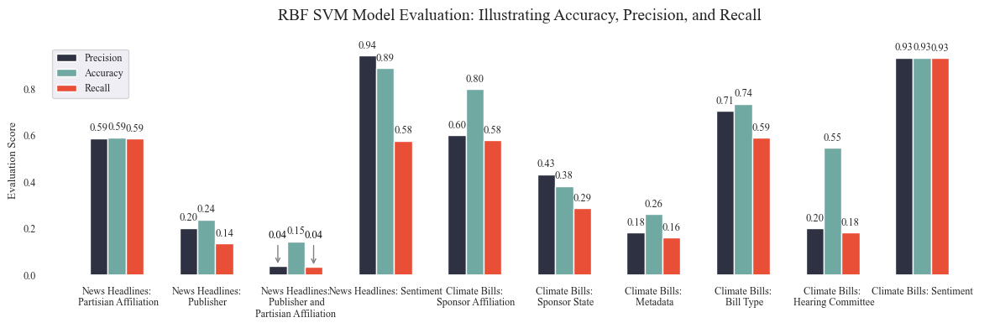

In [112]:
data = [['News Headlines:\n Partisian Affiliation',accuracy_news_data_party, precision_news_data_party, recall_news_data_party],
['News Headlines:\n Publisher',accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher],
['News Headlines:\n Publisher and\nPartisian Affiliation',accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined],
['News Headlines: Sentiment',accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment],
['Climate Bills:\n Sponsor Affiliation',accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party],
['Climate Bills:\n Sponsor State',accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state],
['Climate Bills:\n Metadata',accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined],
['Climate Bills:\n Bill Type',accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type],
['Climate Bills:\n Hearing Committee',accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee],
['Climate Bills: Sentiment',accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment]]


for row in data:
    for i in range(1, 4):  # Loop over the columns with numeric data (index 1, 2, 3)
        row[i] = round(row[i], 3)

model_eval = pd.DataFrame(data, columns=['Model','Accuracy','Precision','Recall'])



fig, ax = plt.subplots(figsize=(12,4))
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=0.8)
ax.set_facecolor('white')

models = model_eval['Model'].to_list()
precision = model_eval['Precision'].to_list()
accuracy = model_eval['Accuracy'].to_list()
recall = model_eval['Recall'].to_list()



ax.set_facecolor('white')

# Width of the bars
bar_width = 0.2


index = np.arange(len(models))

# Plotting bars for Precision, Accuracy, and Recall
bar_precision = ax.bar(index - bar_width, precision, bar_width, label='Precision', color='#2d3142')
bar_accuracy = ax.bar(index, accuracy, bar_width, label='Accuracy', color='#70a9a1')
bar_recall = ax.bar(index + bar_width, recall, bar_width, label='Recall', color='#e94f37')

# Label each bar (with conditional floating & arrow)
def annotate_bars(bars):
    for bar in bars:
        x = bar.get_x() + bar.get_width() / 2
        y = bar.get_height()
        if y < 0.05:
            ax.annotate(
                f'{y:.2f}',
                xy=(x, y),
                xytext=(x, 0.15),
                textcoords='data',
                ha='center', va='bottom',
                arrowprops=dict(arrowstyle='->', color='gray'),
                fontsize=9,
                color='black'
            )
        else:
            ax.text(x, y + 0.02, f'{y:.2f}', ha='center', va='bottom', fontsize=9)

# Apply annotation
annotate_bars(bar_precision)
annotate_bars(bar_accuracy)
annotate_bars(bar_recall)

ax.set_title("RBF SVM Model Evaluation: Illustrating Accuracy, Precision, and Recall\n", fontsize=14)
ax.set_xlabel("")  
ax.set_ylabel("Evaluation Score")
ax.tick_params(axis='x')


ax.set_xticks(index)
ax.set_xticklabels(models)
'''ax.xaxis.set_minor_locator(AutoMinorLocator(5))'''



ax.legend()

plt.tight_layout()

plt.savefig("SVM RBF - cost 100 - Model Evaluation.png",dpi=1000)
plt.show();

### 3.6 RBF Kernel - Cost 1000

#### 3.6.1 News Data

#### 3.6.1.1 News Data: Partisianship

[LibSVM]

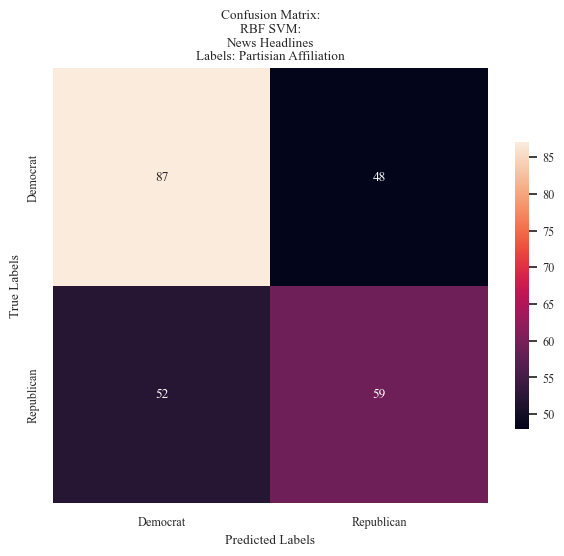

In [88]:
svm_rbf_kernel = sklearn.svm.SVC(C=1000, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_party, precision_news_data_party, recall_news_data_party = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_news_party,
                                                                                                         labels_train = labels_train_news_party,
                                                                                                         data_test = data_test_news_party,
                                                                                                         labels_test = labels_test_news_party,
                                                                                                         label_column_name = 'Party',
                                                                                                         graph_title = 'RBF SVM:\nNews Headlines',
                                                                                                         labels_name = 'Partisian Affiliation',
                                                                                                         file_name = 'svm - rbf - cost 1000 - news - party.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.6.1.2 News Data: Publisher

[LibSVM]

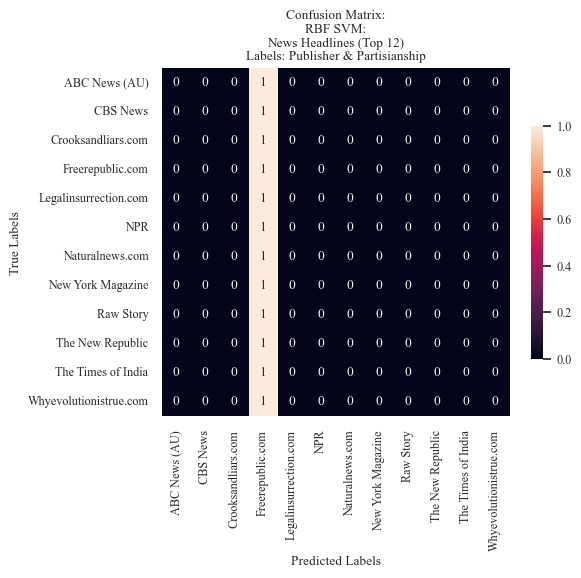

In [89]:
svm_rbf_kernel = sklearn.svm.SVC(C=1000, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_news_publisher,
                                                                                                         labels_train = labels_train_news_publisher,
                                                                                                         data_test = data_test_news_publisher,
                                                                                                         labels_test = labels_test_news_publisher,
                                                                                                         label_column_name = 'publisher',
                                                                                                         graph_title = 'RBF SVM:\nNews Headlines',
                                                                                                         labels_name = 'Publisher & Partisianship',
                                                                                                         file_name = 'svm - rbf - cost 1000 - news - metadata.png',
                                                                                                         filter_top_n = True,
                                                                                                         N = 12,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.6.1.3 News Data: Publisher + Partisianship

[LibSVM]

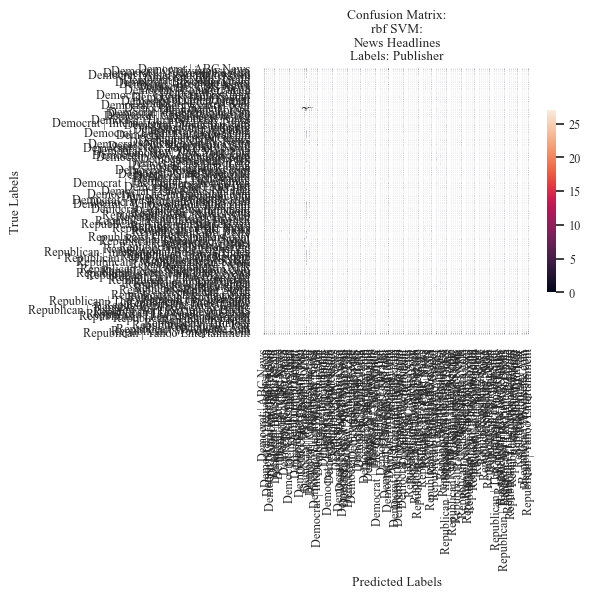

In [90]:
svm_rbf_kernel = sklearn.svm.SVC(C=1000, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_news_combined,
                                                                                                         labels_train = labels_train_news_combined,
                                                                                                         data_test = data_test_news_combined,
                                                                                                         labels_test = labels_test_news_combined,
                                                                                                         label_column_name = 'LABEL',
                                                                                                         graph_title = 'rbf SVM:\nNews Headlines',
                                                                                                         labels_name = 'Publisher',
                                                                                                         file_name = 'svm - rbf - cost 1000 - news - publisher.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 5,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.6.1.4 News Data: Sentiment

[LibSVM]

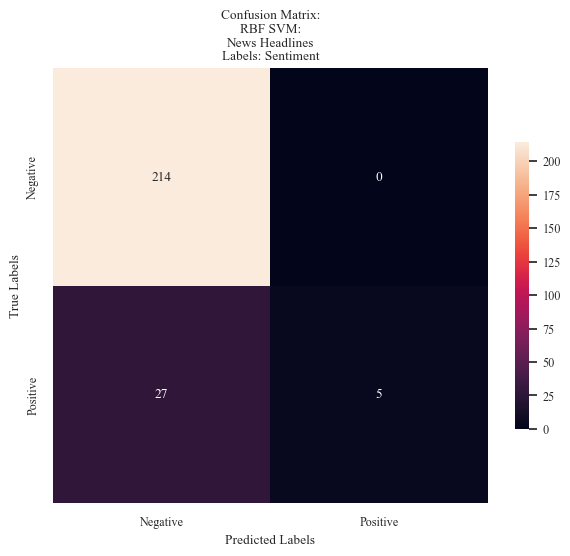

In [91]:
svm_rbf_kernel = sklearn.svm.SVC(C=1000, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_news_sentiment,
                                                                                                         labels_train = labels_train_news_sentiment,
                                                                                                         data_test = data_test_news_sentiment,
                                                                                                         labels_test = labels_test_news_sentiment,
                                                                                                         label_column_name = 'SENTIMENT',
                                                                                                         graph_title = 'RBF SVM:\nNews Headlines',
                                                                                                         labels_name = 'Sentiment',
                                                                                                         file_name = 'svm - rbf - cost 1000 - news - sentiment.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.6.2 Proposed Cliamte Bills

#### 3.6.2.1 Bills Data: Sponsor Affiliation

[LibSVM]

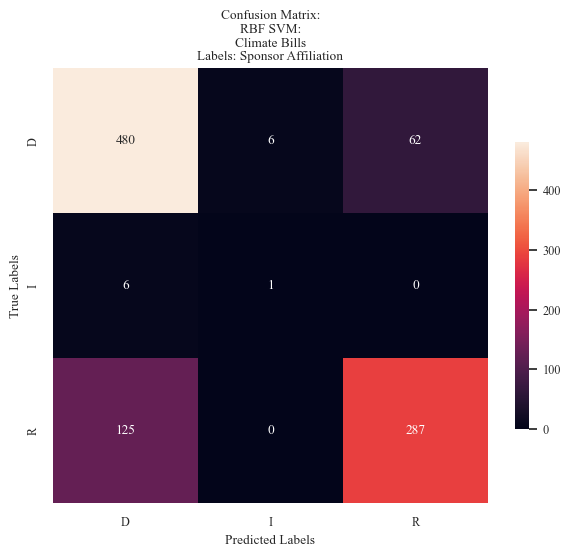

In [92]:
svm_rbf_kernel = sklearn.svm.SVC(C=1000, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_bills_party,
                                                                                                         labels_train = labels_train_bills_party,
                                                                                                         data_test = data_test_bills_party,
                                                                                                         labels_test = labels_test_bills_party,
                                                                                                         label_column_name = 'Sponser Affiliation',
                                                                                                         graph_title = 'RBF SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sponsor Affiliation',
                                                                                                         file_name = 'svm - rbf - cost 1000 - bills - sponsor party.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.6.2.2 Bills Data: Sponsor State

[LibSVM]

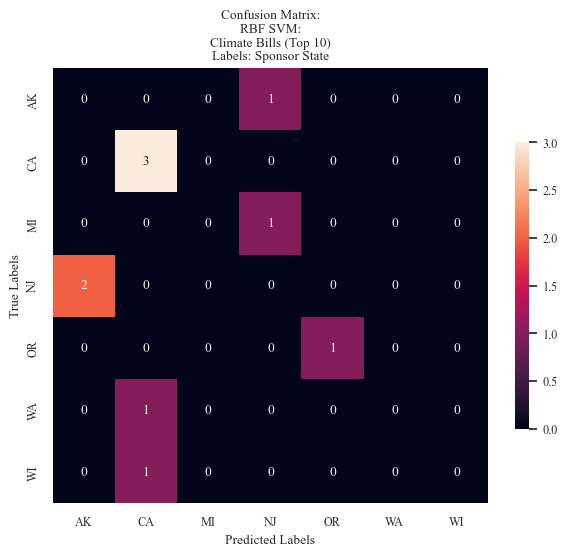

In [93]:
svm_rbf_kernel = sklearn.svm.SVC(C=1000, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_bills_state,
                                                                                                         labels_train = labels_train_bills_state,
                                                                                                         data_test = data_test_bills_state,
                                                                                                         labels_test = labels_test_bills_state,
                                                                                                         label_column_name = 'Sponser State',
                                                                                                         graph_title = 'RBF SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sponsor State',
                                                                                                         file_name = 'svm - rbf - cost 1000 - bills - sponsor state.png',
                                                                                                         filter_top_n = True,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.6.2.3 Bills Data: Committee

[LibSVM]

C:\Users\natal\AppData\Local\Temp\ipykernel_16624\1919670016.py:21: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(pad=.5)


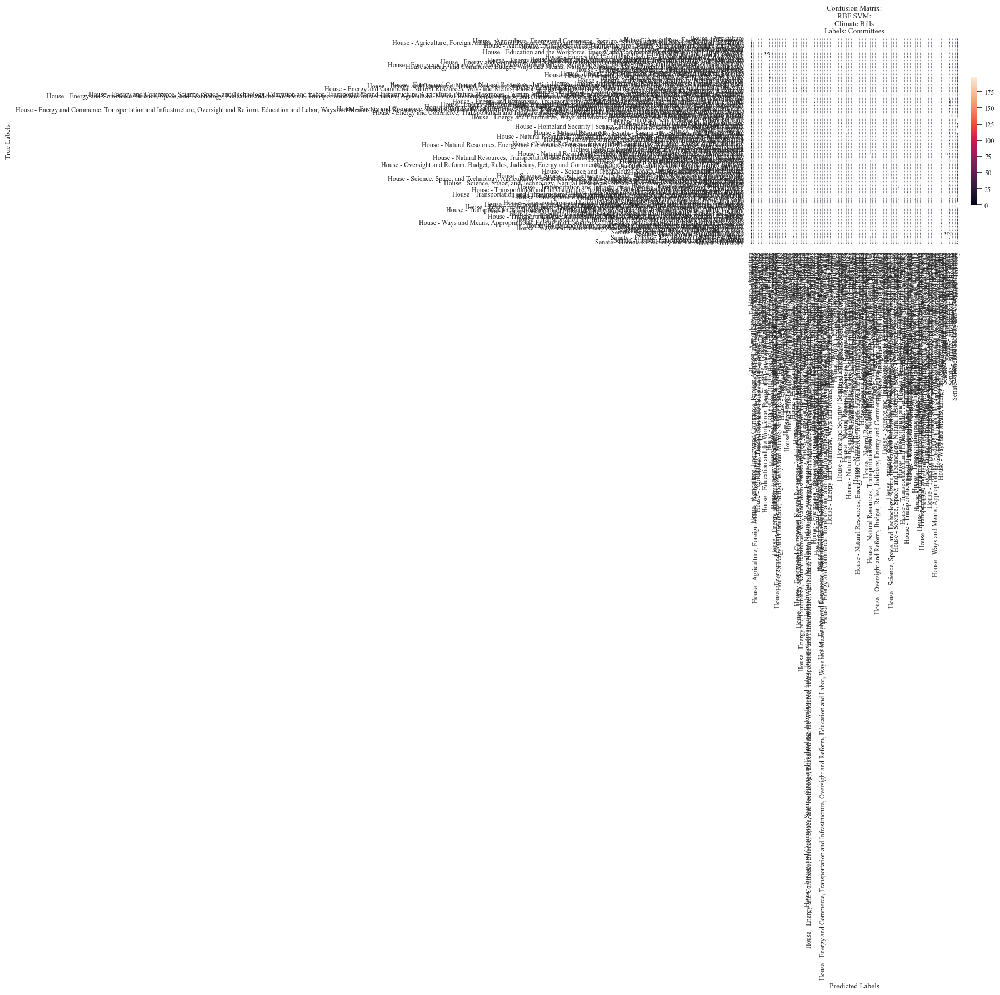

In [94]:
svm_rbf_kernel = sklearn.svm.SVC(C=1000, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_bills_committee,
                                                                                                         labels_train = labels_train_bills_committee,
                                                                                                         data_test = data_test_bills_committee,
                                                                                                         labels_test = labels_test_bills_committee,
                                                                                                         label_column_name = 'Committees',
                                                                                                         graph_title = 'RBF SVM:\nClimate Bills',
                                                                                                         labels_name = 'Committees',
                                                                                                         file_name = 'svm - rbf - cost 1000 - bills - commitees.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.6.2.4 Bills Data: Metadata

[LibSVM]

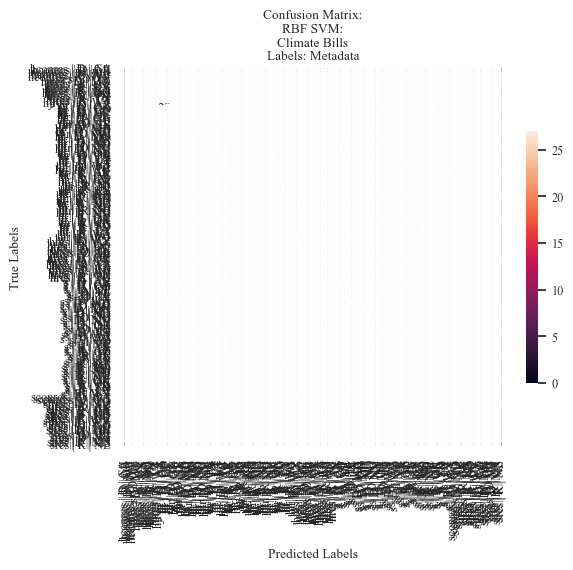

In [95]:
svm_rbf_kernel = sklearn.svm.SVC(C=1000, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_bills_combined,
                                                                                                         labels_train = labels_train_bills_combined,
                                                                                                         data_test = data_test_bills_combined,
                                                                                                         labels_test = labels_test_bills_combined,
                                                                                                         label_column_name = 'LABEL',
                                                                                                         graph_title = 'RBF SVM:\nClimate Bills',
                                                                                                         labels_name = 'Metadata',
                                                                                                         file_name = 'svm - rbf - cost 1000 - bills - metadata.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.6.2.5 Bills Data: Bill Type

[LibSVM]

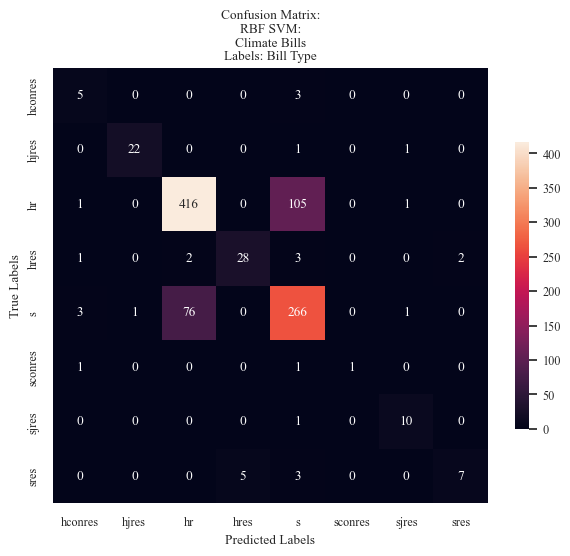

In [96]:
svm_rbf_kernel = sklearn.svm.SVC(C=1000, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_bills_type,
                                                                                                         labels_train = labels_train_bills_type,
                                                                                                         data_test = data_test_bills_type,
                                                                                                         labels_test = labels_test_bills_type,
                                                                                                         label_column_name = 'Bill Type',
                                                                                                         graph_title = 'RBF SVM:\nClimate Bills',
                                                                                                         labels_name = 'Bill Type',
                                                                                                         file_name = 'svm - rbf - cost 1000 - bills - bill type.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

#### 3.6.2.6 Bills Data: Sentiment

[LibSVM]

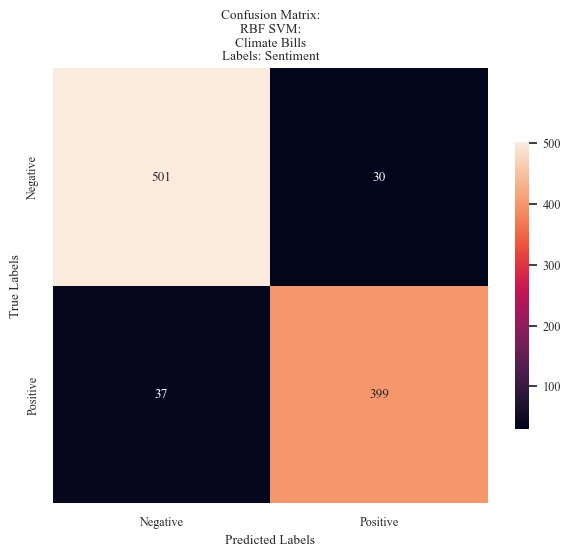

In [97]:
svm_rbf_kernel = sklearn.svm.SVC(C=1000, kernel = 'rbf', degree = 1, gamma = 'scale', verbose = True, random_state=12)

accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment = svm_modeler(svm_model = svm_rbf_kernel,
                                                                                                         data_train = data_train_bills_sentiment,
                                                                                                         labels_train = labels_train_bills_sentiment,
                                                                                                         data_test = data_test_bills_sentiment,
                                                                                                         labels_test = labels_test_bills_sentiment,
                                                                                                         label_column_name = 'SENTIMENT',
                                                                                                         graph_title = 'RBF SVM:\nClimate Bills',
                                                                                                         labels_name = 'Sentiment',
                                                                                                         file_name = 'svm - rbf - cost 1000 - bills - sentiment.png',
                                                                                                         filter_top_n = False,
                                                                                                         N = 10,
                                                                                                         fig_x = 6,
                                                                                                         fig_y = 6)
                                                                                                         

### 3.6.3 Assessing Validity

In [98]:
data = [['News Headlines: Partisian Affiliation',accuracy_news_data_party, precision_news_data_party, recall_news_data_party],
['News Headlines: Publisher',accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher],
['News Headlines: Sentiment',accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment],
['News Headlines: Publisher and Partisian Affiliation',accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined],
['Climate Bills: Sponsor Affiliation',accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party],
['Climate Bills: Sponsor State',accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state],
['Climate Bills: Metadata',accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined],
['Climate Bills: Bill Type',accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type],
['Climate Bills: Hearing Committee',accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee],
['Climate Bills: Sentiment',accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment]]


for row in data:
    for i in range(1, 4):  # Loop over the columns with numeric data (index 1, 2, 3)
        row[i] = round(row[i], 3)
        
headers = ['', ' Accuracy', 'Precision', 'Recall']

table = tabulate(data, headers=headers, tablefmt='html', numalign='center', stralign = 'left')

with open("SVM RBF - cost 1000 - Model Evaluation.html", "w") as file:
    file.write(table)

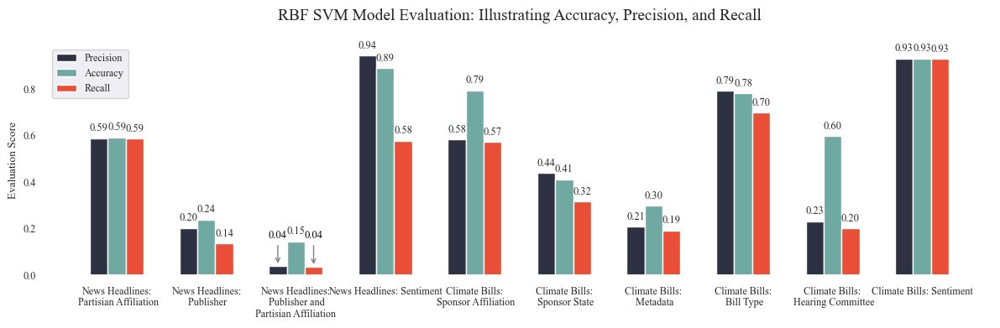

In [99]:
data = [['News Headlines:\n Partisian Affiliation',accuracy_news_data_party, precision_news_data_party, recall_news_data_party],
['News Headlines:\n Publisher',accuracy_news_data_publisher, precision_news_data_publisher, recall_news_data_publisher],
['News Headlines:\n Publisher and\nPartisian Affiliation',accuracy_news_data_combined, precision_news_data_combined, recall_news_data_combined],
['News Headlines: Sentiment',accuracy_news_data_sentiment, precision_news_data_sentiment, recall_news_data_sentiment],
['Climate Bills:\n Sponsor Affiliation',accuracy_bills_data_party, precision_bills_data_party, recall_bills_data_party],
['Climate Bills:\n Sponsor State',accuracy_bills_data_state, precision_bills_data_state, recall_bills_data_state],
['Climate Bills:\n Metadata',accuracy_bills_data_combined, precision_bills_data_combined, recall_bills_data_combined],
['Climate Bills:\n Bill Type',accuracy_bills_data_type, precision_bills_data_type, recall_bills_data_type],
['Climate Bills:\n Hearing Committee',accuracy_bills_data_committee, precision_bills_data_committee, recall_bills_data_committee],
['Climate Bills: Sentiment',accuracy_bills_data_sentiment, precision_bills_data_sentiment, recall_bills_data_sentiment]]


for row in data:
    for i in range(1, 4):  # Loop over the columns with numeric data (index 1, 2, 3)
        row[i] = round(row[i], 3)

model_eval = pd.DataFrame(data, columns=['Model','Accuracy','Precision','Recall'])



fig, ax = plt.subplots(figsize=(12,4))
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=0.8)
ax.set_facecolor('white')

models = model_eval['Model'].to_list()
precision = model_eval['Precision'].to_list()
accuracy = model_eval['Accuracy'].to_list()
recall = model_eval['Recall'].to_list()



ax.set_facecolor('white')

# Width of the bars
bar_width = 0.2


index = np.arange(len(models))

# Plotting bars for Precision, Accuracy, and Recall
bar_precision = ax.bar(index - bar_width, precision, bar_width, label='Precision', color='#2d3142')
bar_accuracy = ax.bar(index, accuracy, bar_width, label='Accuracy', color='#70a9a1')
bar_recall = ax.bar(index + bar_width, recall, bar_width, label='Recall', color='#e94f37')

# Label each bar (with conditional floating & arrow)
def annotate_bars(bars):
    for bar in bars:
        x = bar.get_x() + bar.get_width() / 2
        y = bar.get_height()
        if y < 0.05:
            ax.annotate(
                f'{y:.2f}',
                xy=(x, y),
                xytext=(x, 0.15),
                textcoords='data',
                ha='center', va='bottom',
                arrowprops=dict(arrowstyle='->', color='gray'),
                fontsize=9,
                color='black'
            )
        else:
            ax.text(x, y + 0.02, f'{y:.2f}', ha='center', va='bottom', fontsize=9)

# Apply annotation
annotate_bars(bar_precision)
annotate_bars(bar_accuracy)
annotate_bars(bar_recall)

ax.set_title("RBF SVM Model Evaluation: Illustrating Accuracy, Precision, and Recall\n", fontsize=14)
ax.set_xlabel("")  
ax.set_ylabel("Evaluation Score")
ax.tick_params(axis='x')


ax.set_xticks(index)
ax.set_xticklabels(models)
'''ax.xaxis.set_minor_locator(AutoMinorLocator(5))'''



ax.legend()

plt.tight_layout()

plt.savefig("RBF Poly - cost 1000 - Model Evaluation.png",dpi=1000)
plt.show();

## Graph Gallery

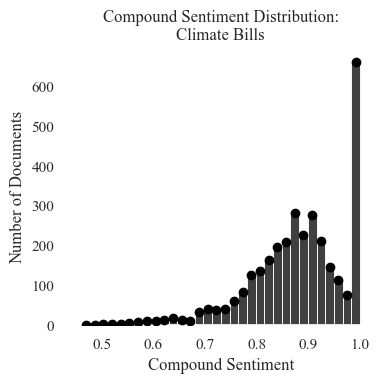

In [108]:
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1)
fig, ax = plt.subplots(figsize=(4, 4)) 
ax.set_facecolor('white')


hist = sb.histplot(
    data=sentiment_bills,
   color='black',
    ax=ax
)

for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)

ax.set_title("Compound Sentiment Distribution:\nClimate Bills")
ax.set_xlabel("Compound Sentiment")
ax.set_ylabel("Number of Documents")
ax.tick_params(axis='x')

ax = plt.gca()
ax.xaxis.set_minor_locator(AutoMinorLocator(5))  
ax.grid(which='minor', linestyle=':', linewidth='0.5')  # Optional: style minor gridlines
ax.grid(which='major', linestyle='-', linewidth='0.75')  # Optional: style major gridlines

plt.tight_layout()

plt.savefig("SVM - Climate Bills Sentiment Distribution.png",dpi=1000)
plt.show();

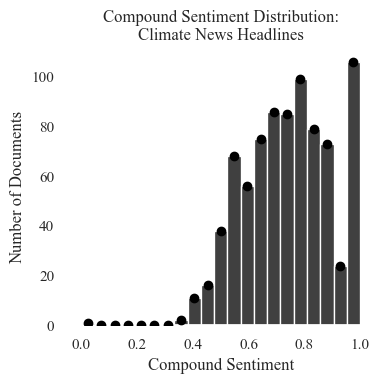

In [109]:
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1)
fig, ax = plt.subplots(figsize=(4, 4)) 
ax.set_facecolor('white')


hist = sb.histplot(
    data=sentiment_news,
   color='black',
    ax=ax
)

for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)

ax.set_title("Compound Sentiment Distribution:\nClimate News Headlines")
ax.set_xlabel("Compound Sentiment")
ax.set_ylabel("Number of Documents")
ax.tick_params(axis='x')

ax = plt.gca()
ax.xaxis.set_minor_locator(AutoMinorLocator(5))  
ax.grid(which='minor', linestyle=':', linewidth='0.5')  # Optional: style minor gridlines
ax.grid(which='major', linestyle='-', linewidth='0.75')  # Optional: style major gridlines

plt.tight_layout()

plt.savefig("SVM - Climate News Sentiment Distribution.png",dpi=1000)
plt.show();

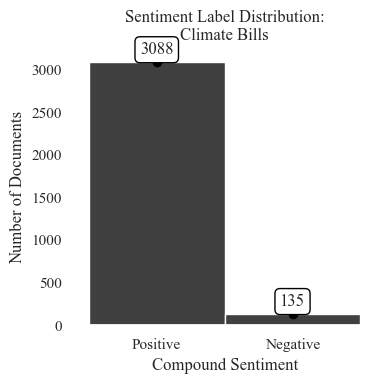

In [139]:
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1)
fig, ax = plt.subplots(figsize=(4, 4)) 
ax.set_facecolor('white')


hist = sb.histplot(
    data=sentiment_bills_labels,
   color='black',
    ax=ax
)

for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)

for container in hist.containers:
    hist.bar_label(container, fmt='%d', label_type='edge', padding=3, bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"))


ax.set_title("Sentiment Label Distribution:\nClimate Bills")
ax.set_xlabel("Compound Sentiment")
ax.set_ylabel("Number of Documents")
ax.tick_params(axis='x')

ax = plt.gca()
ax.xaxis.set_minor_locator(AutoMinorLocator(5))  
ax.grid(which='minor', linestyle=':', linewidth='0.5')  # Optional: style minor gridlines
ax.grid(which='major', linestyle='-', linewidth='0.75')  # Optional: style major gridlines

plt.tight_layout()

plt.savefig("SVM - Climate Bills Sentiment Label Distribution.png",dpi=1000)
plt.show();

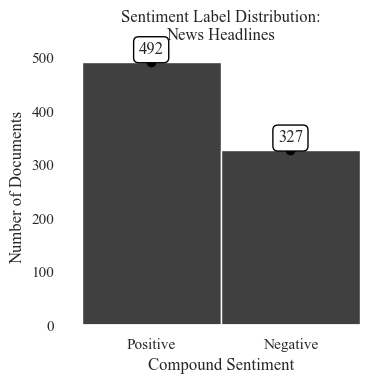

In [140]:
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1)
fig, ax = plt.subplots(figsize=(4, 4)) 
ax.set_facecolor('white')


hist = sb.histplot(
    data=sentiment_news_labels,
   color='black',
    ax=ax
)

for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)

for container in hist.containers:
    hist.bar_label(container, fmt='%d', label_type='edge', padding=3, bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"))


ax.set_title("Sentiment Label Distribution:\nNews Headlines")
ax.set_xlabel("Compound Sentiment")
ax.set_ylabel("Number of Documents")
ax.tick_params(axis='x')

ax = plt.gca()
ax.xaxis.set_minor_locator(AutoMinorLocator(5))  
ax.grid(which='minor', linestyle=':', linewidth='0.5')  # Optional: style minor gridlines
ax.grid(which='major', linestyle='-', linewidth='0.75')  # Optional: style major gridlines

plt.tight_layout()

plt.savefig("SVM - Climate News Headlines Sentiment Label Distribution.png",dpi=1000)
plt.show();